In [119]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



In [120]:
df = pd.read_csv('train.csv')

In [121]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [122]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [123]:
df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

# 1st Step to Check missing Values

In [124]:
missing = df.isnull().sum()
missing_percent = (len(missing) / len(df)) * 100

missing_data = pd.DataFrame({
    'Total': missing,
    'Percent': missing_percent
}).sort_values(by='Total', ascending=False)

missing_data = missing_data[missing_data['Total'] > 0]
missing_data.head(20)


,Total,Percent
PoolQC,1453,5.547945
MiscFeature,1406,5.547945
Alley,1369,5.547945
Fence,1179,5.547945
MasVnrType,872,5.547945
FireplaceQu,690,5.547945
LotFrontage,259,5.547945
GarageYrBlt,81,5.547945
GarageCond,81,5.547945
GarageType,81,5.547945


In [125]:
numerical_vars = df.select_dtypes(include=['number']).columns
print(numerical_vars)


Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')


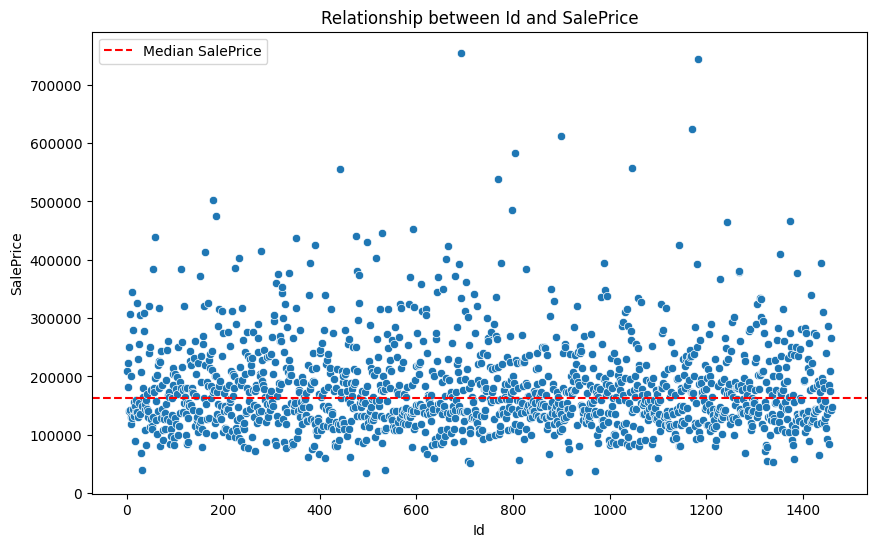

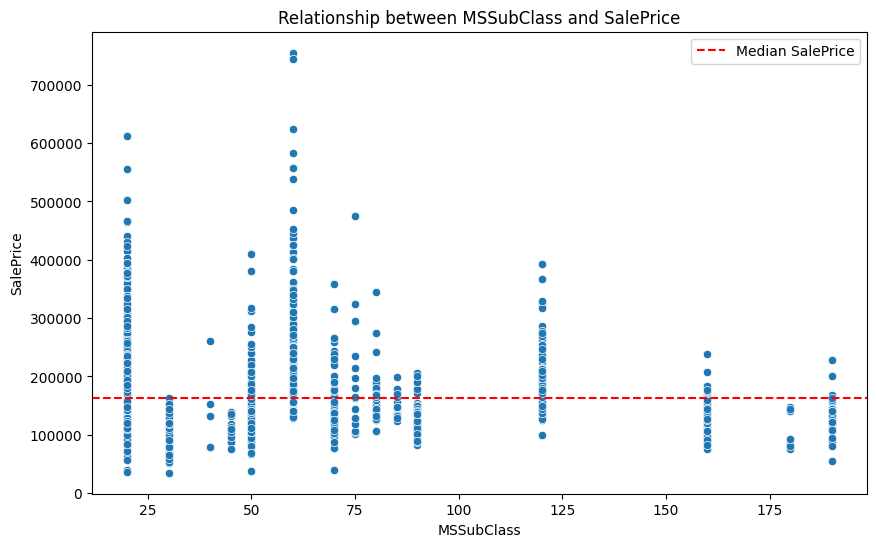

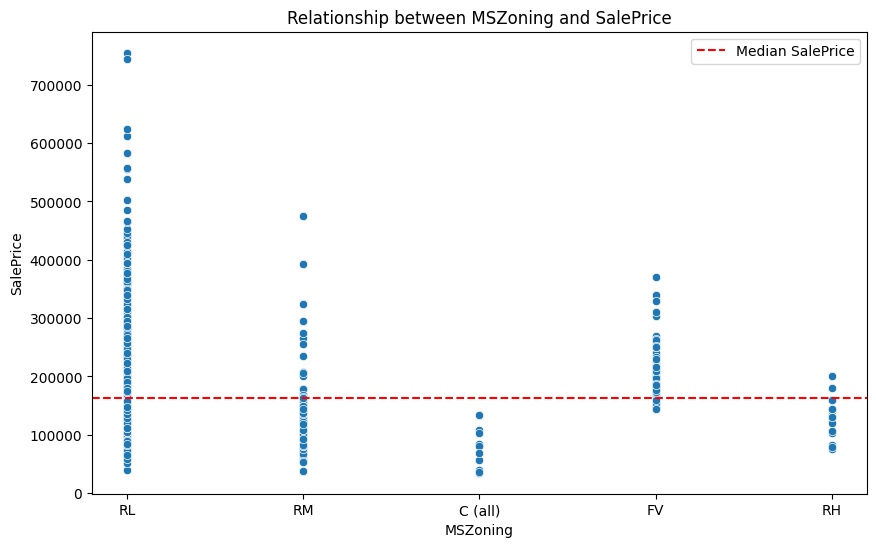

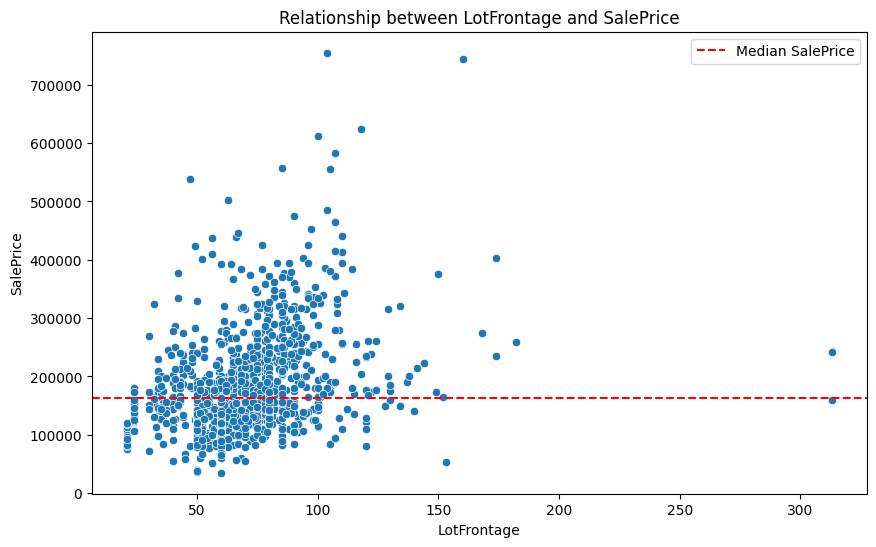

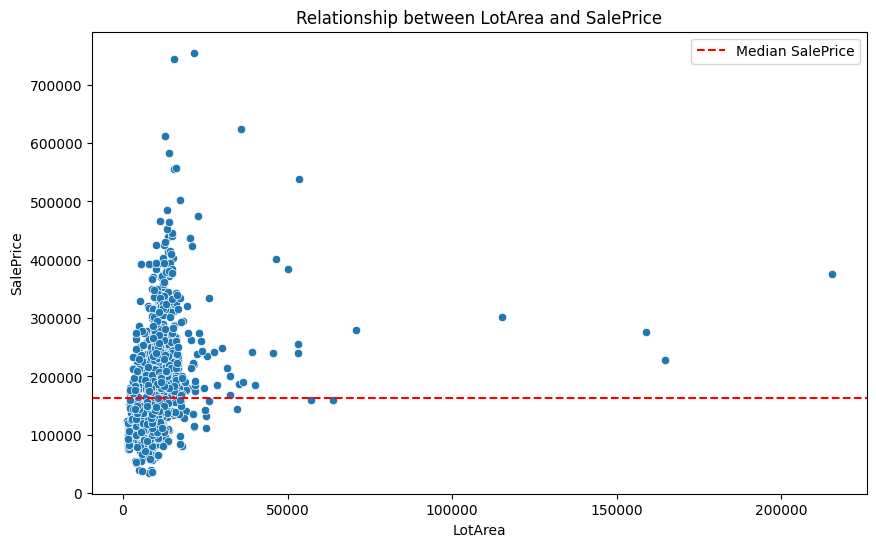

...

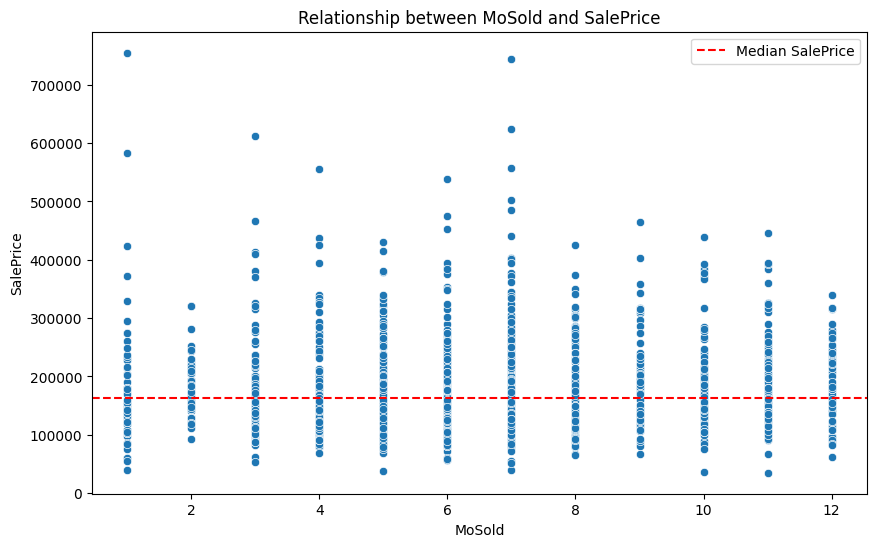

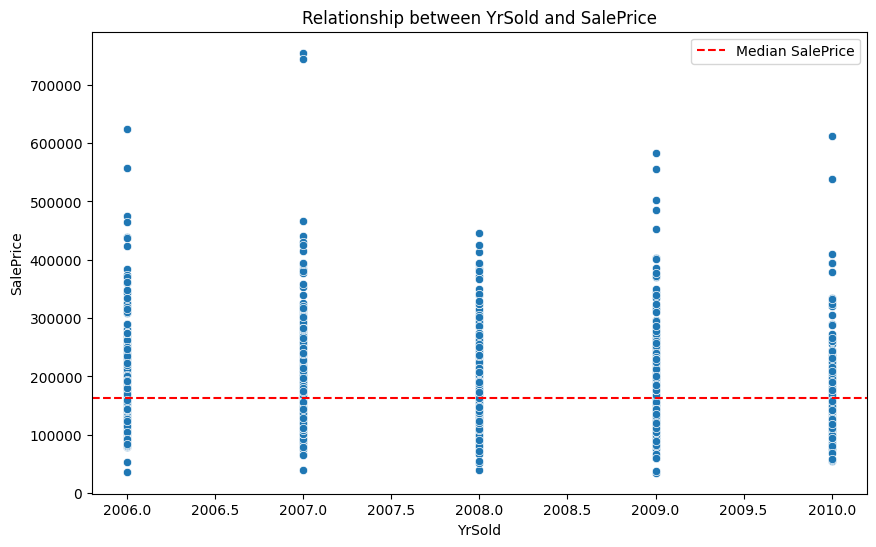

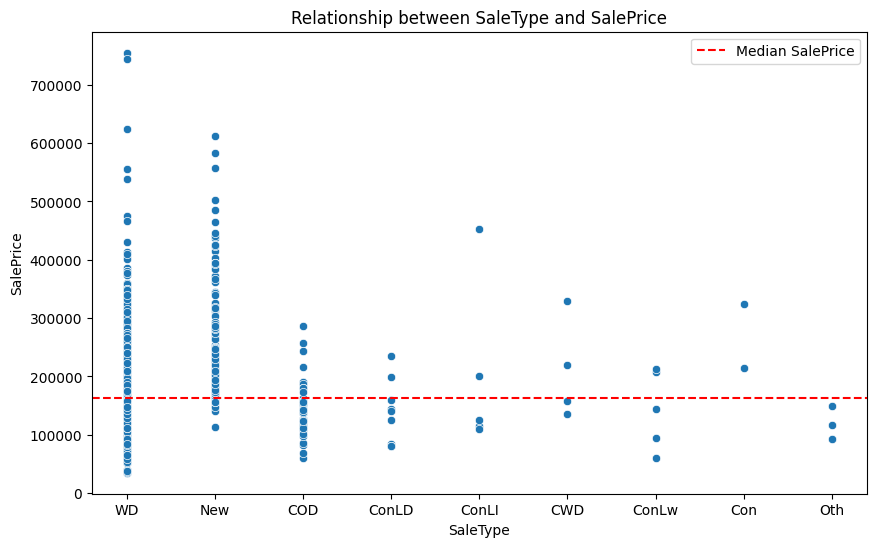

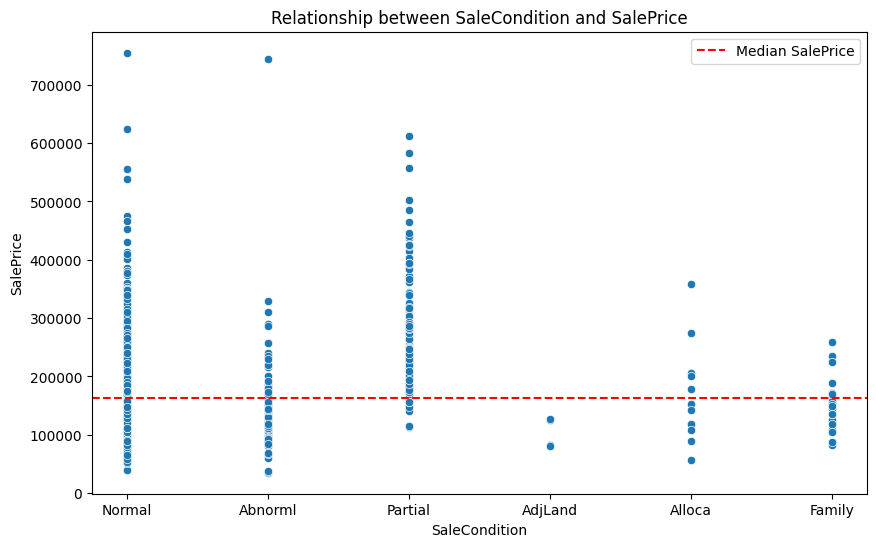

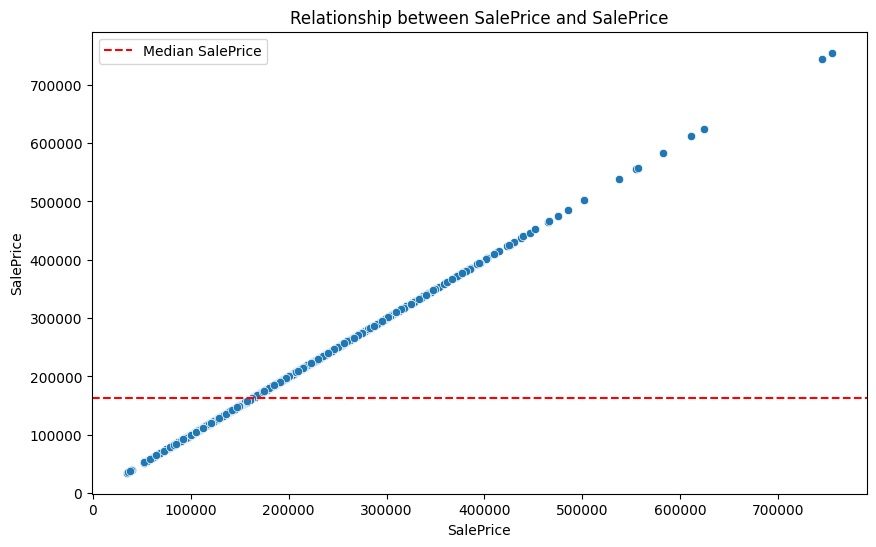

In [126]:
median = df['SalePrice'].median()
df4 = df.copy()
for var in missing.index:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df4[var], y=df4['SalePrice'])
    plt.axhline(y=median, color='red', linestyle='--', label='Median SalePrice')
    plt.title(f'Relationship between {var} and SalePrice')
    plt.xlabel(var)
    plt.ylabel('SalePrice')
    plt.legend()
    plt.show()

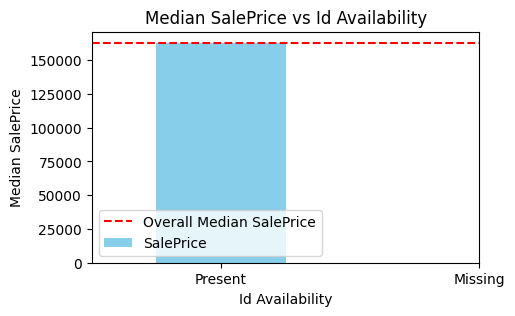

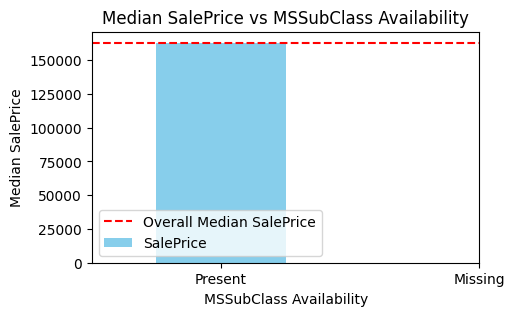

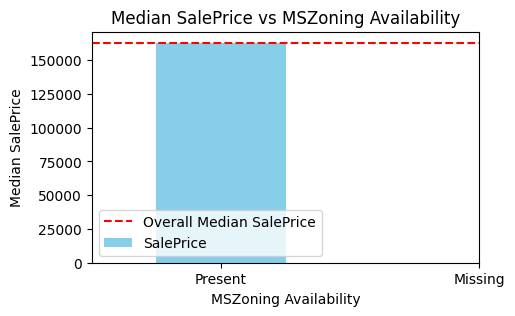

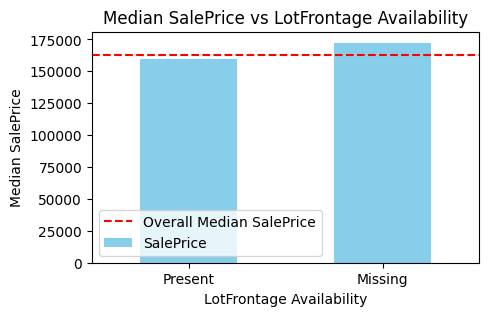

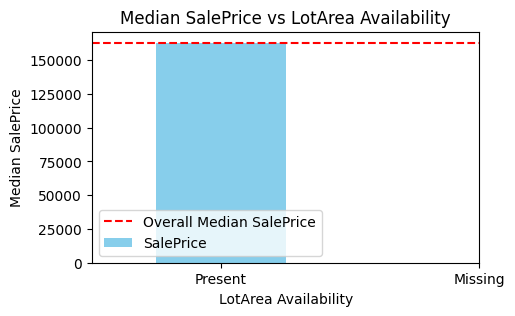

...

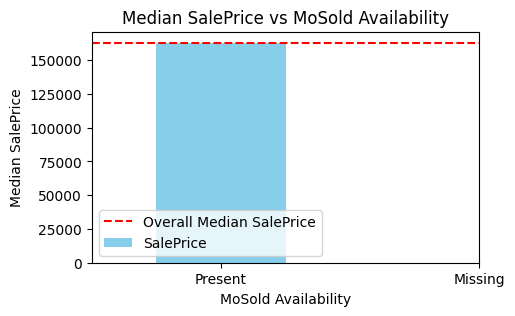

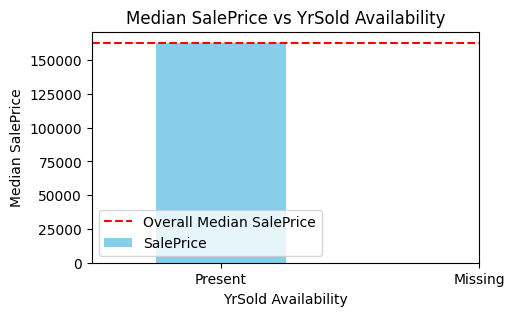

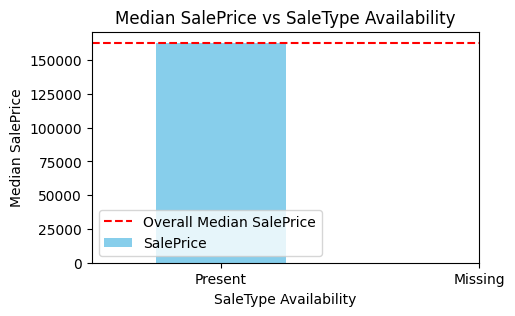

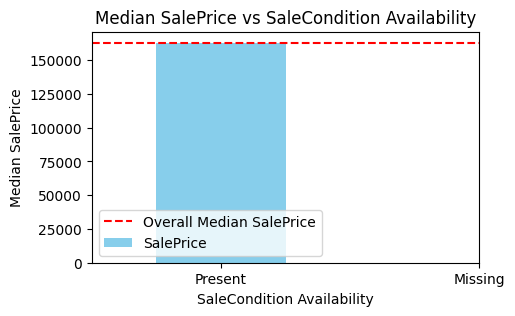

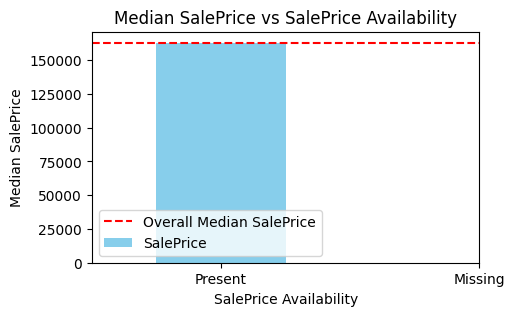

In [127]:
for feature in missing.index:
    df2 = df.copy()
    df2[feature + '_missing'] = df2[feature].isnull().astype(int)
    median_prices = df2.groupby(feature + '_missing')['SalePrice'].median()


    plt.figure(figsize = (5,3))
    median_prices.plot(kind = 'bar', color = 'skyblue')
    plt.title(f'Median SalePrice vs {feature} Availability')
    plt.xlabel(f'{feature} Availability')
    plt.ylabel("Median SalePrice")
    plt.xticks(ticks=[0, 1], labels=['Present', 'Missing'], rotation=0)
    plt.axhline(y=median, color='red', linestyle='--', label='Overall Median SalePrice')
    plt.legend()
    plt.show()

# In the analysis, we observed the relationship between missing values in different features and the dependent variable, `SalePrice`. The bar plots provided a clear view of how the median `SalePrice` differs between instances with missing values and those without. This insight is crucial for understanding the impact of missing data on our target variable.


In [128]:
numerical_features = [feature for feature in df.columns if df[feature].dtypes != 'O']
print(f'Number of numerical variables: {len(numerical_features)}')
df[numerical_features].head()

Number of numerical variables: 38


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000


In [129]:
# List of variables that contain year information
year = [feature for feature in numerical_features if 'Yr' in feature or 'Year' in feature]

year

['YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

In [130]:
for col in year:
    count = df[col].nunique() #nunique counts the total length of unique values or you can calculate this by first using unique function then applying len fungtion
    datype = df[col].dtype
    print(f"{col}: {count}", "unique values")

YearBuilt: 112 unique values
YearRemodAdd: 61 unique values
GarageYrBlt: 97 unique values
YrSold: 5 unique values


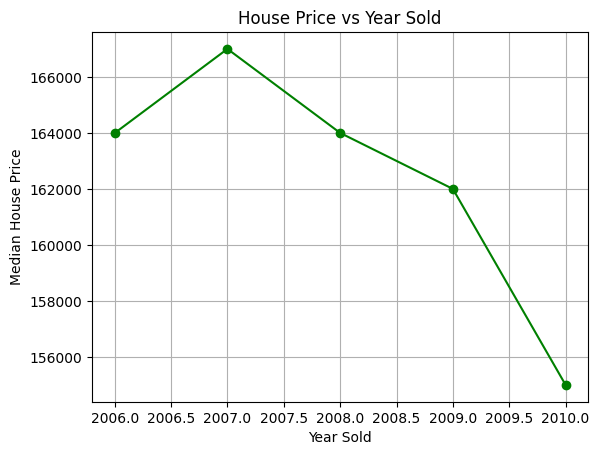

In [131]:
median_price = df.groupby('YrSold')['SalePrice'].median()
plt.figure()
median_price.plot(marker = 'o', linestyle = '-', color = 'g', grid = True)
plt.xlabel('Year Sold')
plt.ylabel('Median House Price')
plt.title("House Price vs Year Sold")
plt.show()

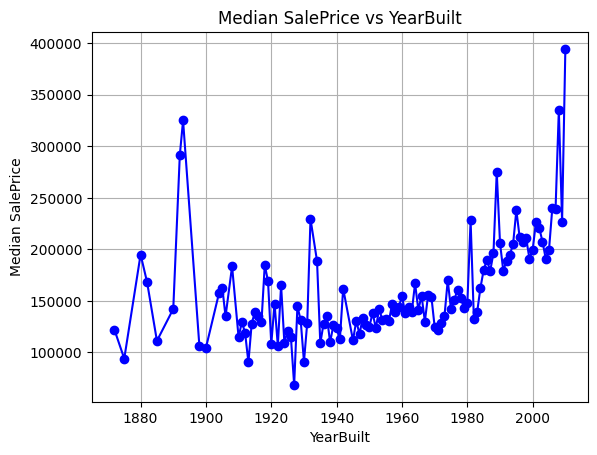

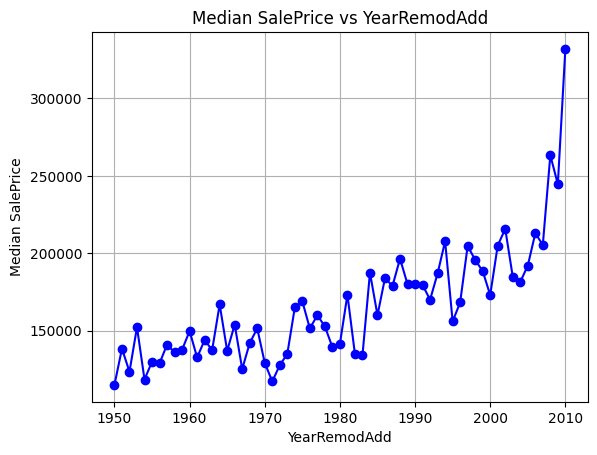

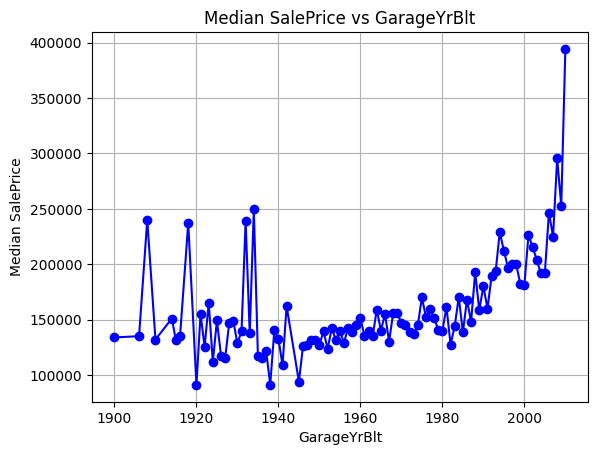

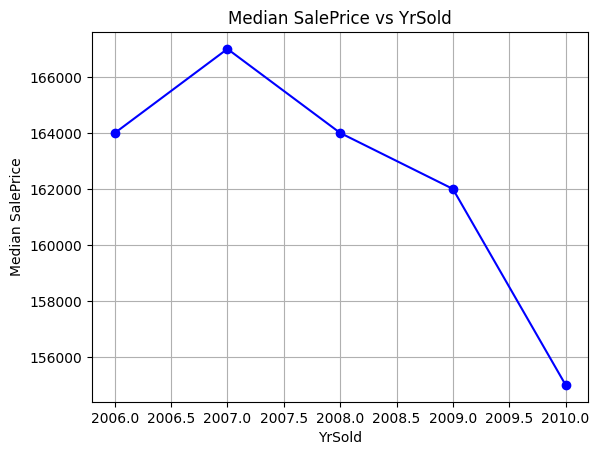

In [132]:
for col in year:
    median_price = df.groupby(col)['SalePrice'].median()
    plt.figure()
    median_price.plot(marker = 'o', linestyle = '-', color = 'b', grid = True)
    plt.xlabel(col)
    plt.ylabel('Median SalePrice')
    plt.title(f'Median SalePrice vs {col}')
    plt.show()

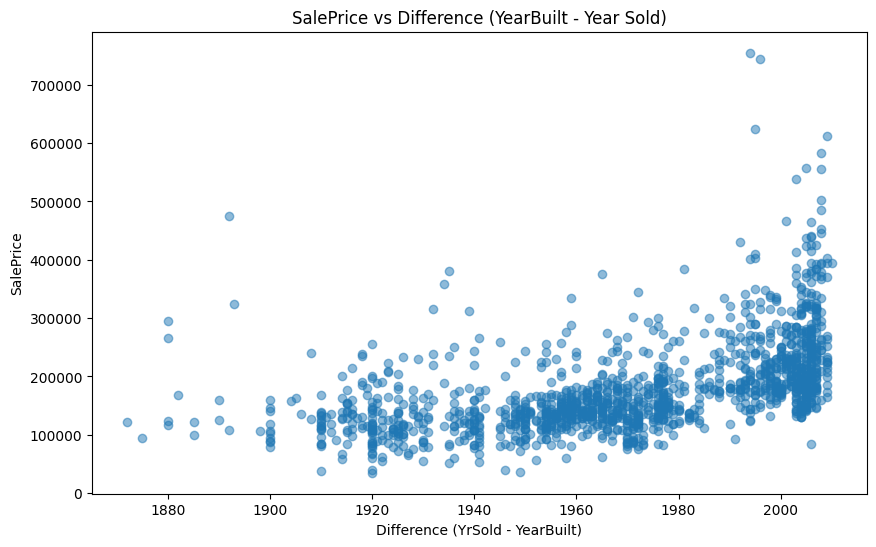

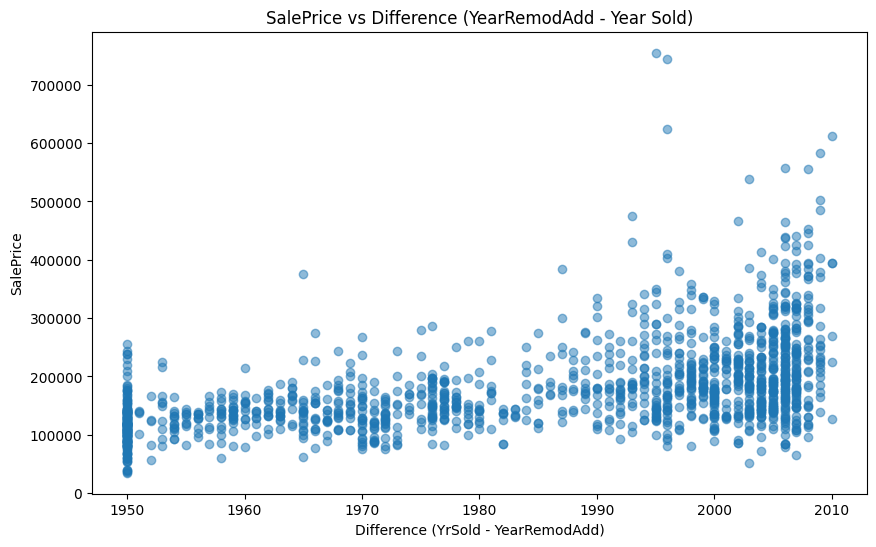

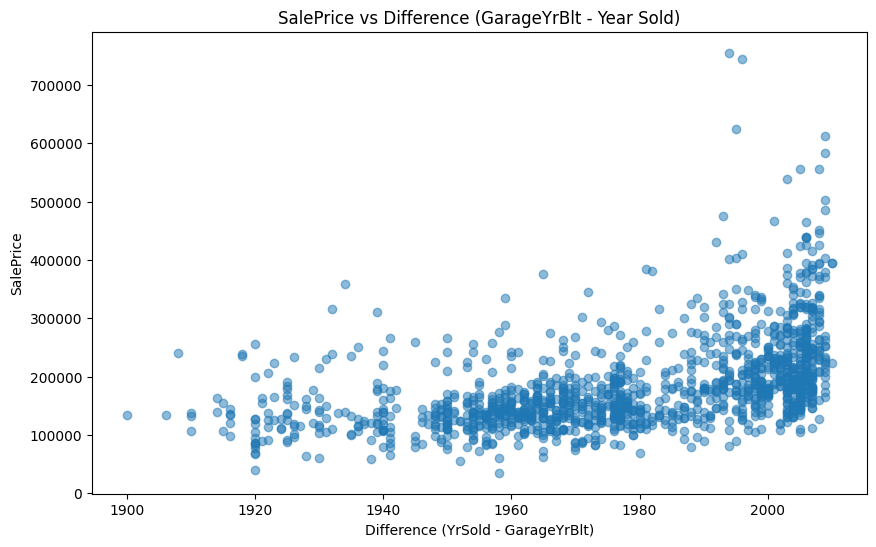

In [133]:
for col in year:
    if col != 'YrSold':
        df3 = df.copy()
        df3[col] = df3['YrSold'] - df[col]

        plt.figure(figsize=(10, 6))
        plt.scatter(df2[col],df['SalePrice'], alpha = 0.5)
        plt.title(f"SalePrice vs Difference ({col} - Year Sold)")
        plt.xlabel(f'Difference (YrSold - {col})')
        plt.ylabel('SalePrice')
        plt.show()

In [134]:
df_num = df.select_dtypes(include = ['float64', 'int64'])
print(df_num.shape[1])
df_num.head()

38


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000


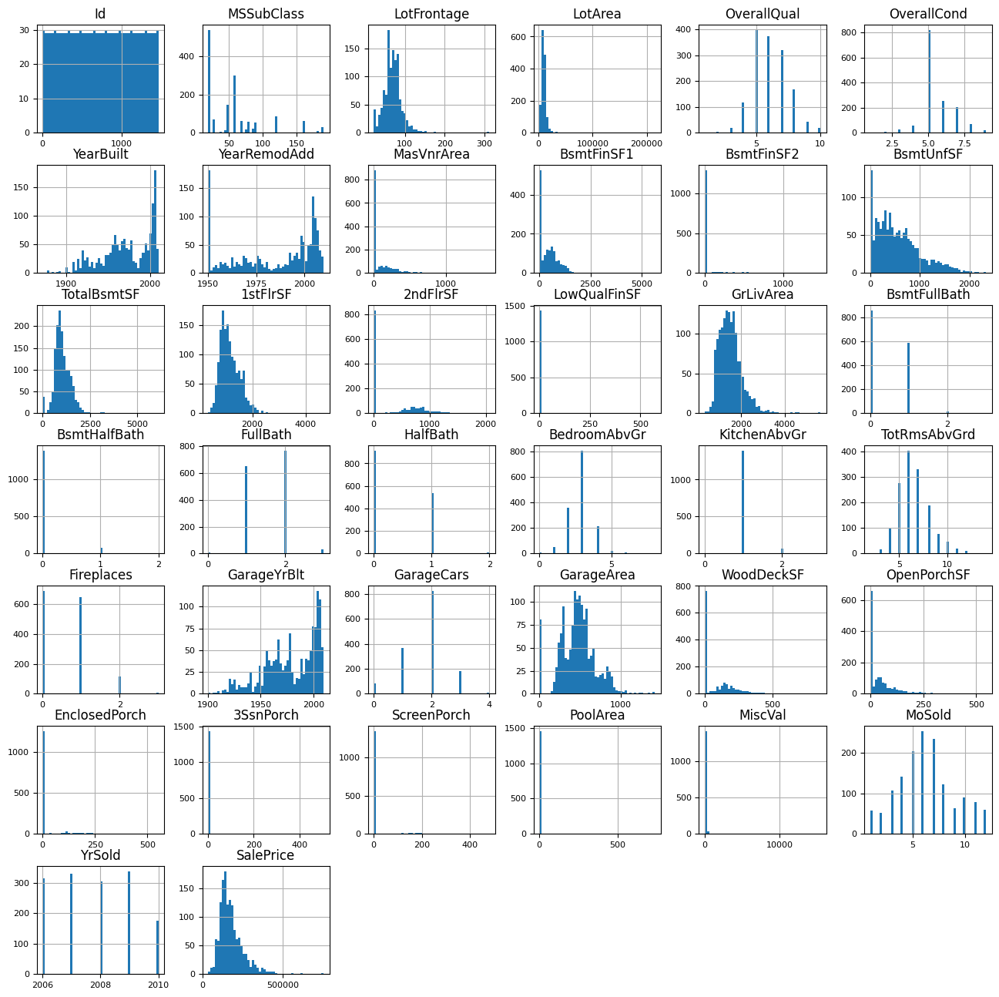

In [135]:
df_num.hist(figsize=(16, 16), bins=50, xlabelsize=8, ylabelsize=8);

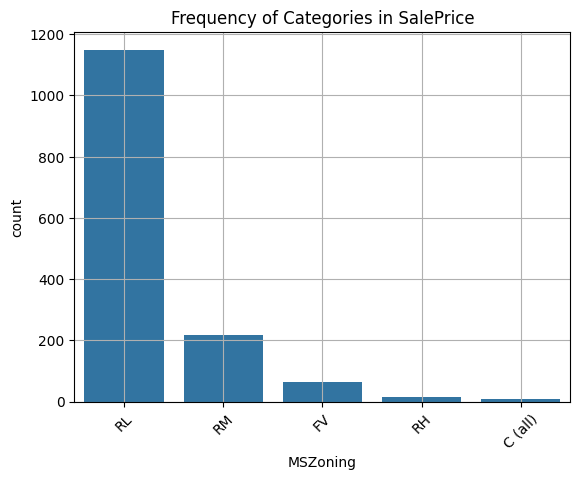

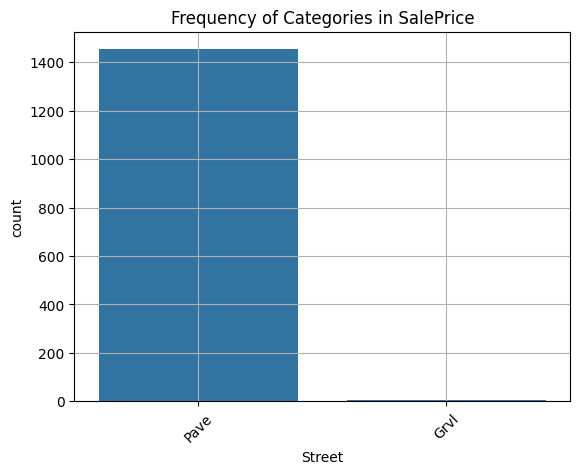

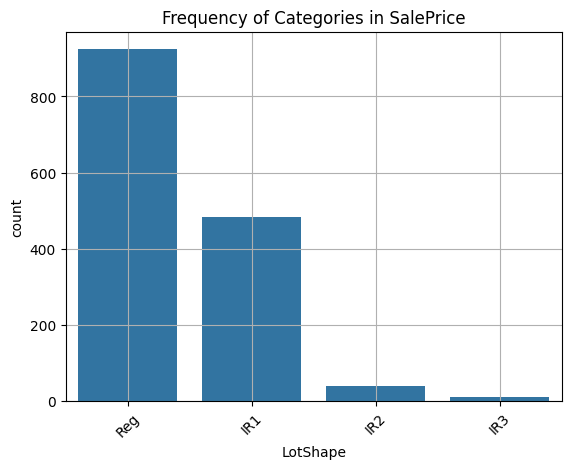

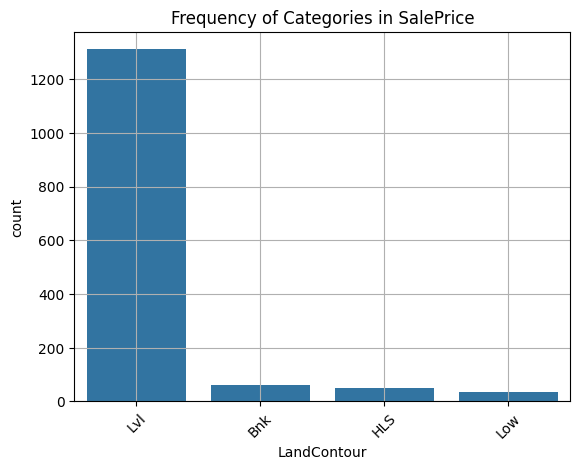

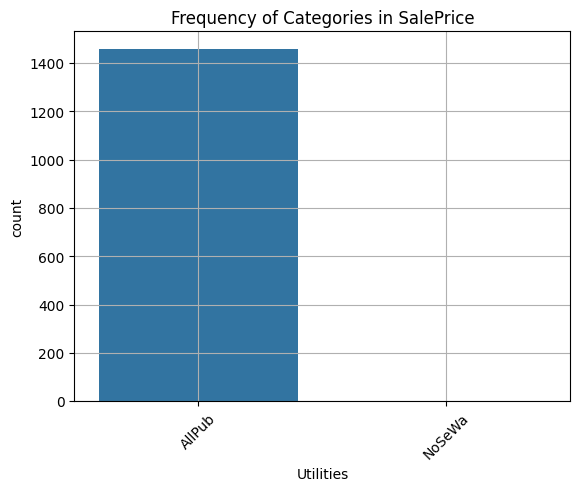

...

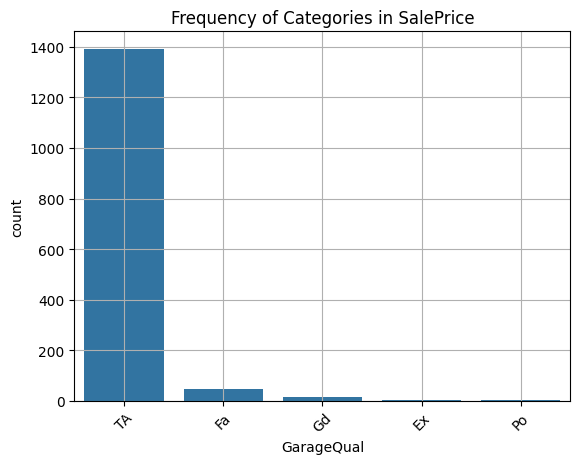

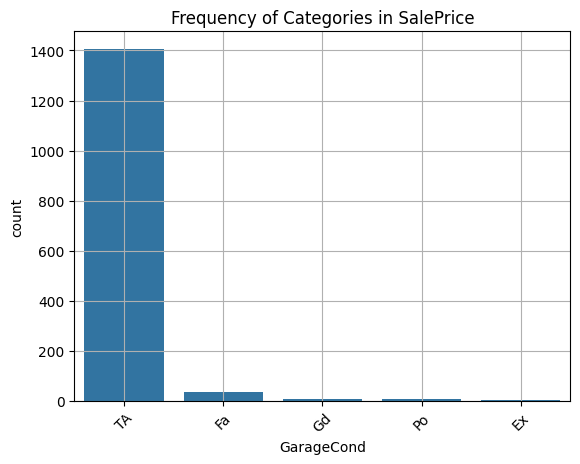

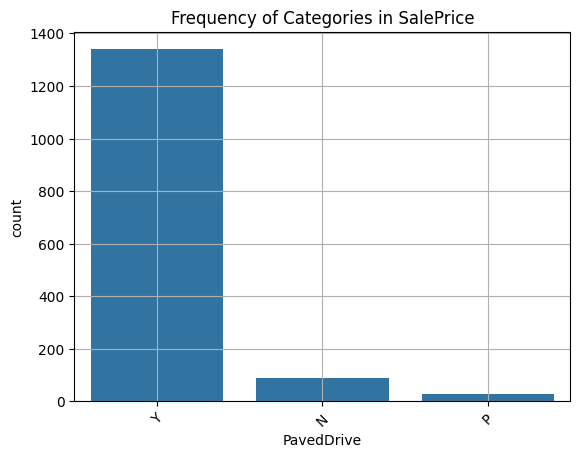

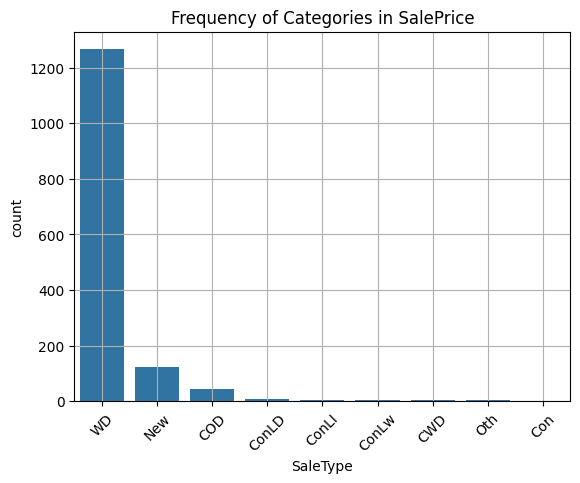

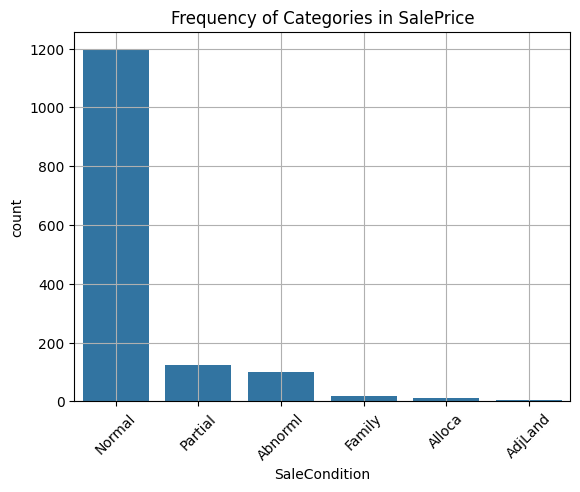

In [189]:
df_obj = df.select_dtypes(include = 'object').columns
for col in df_obj:
    plt.figure()
    sns.countplot(data = df, x = col, order = df[col].value_counts().index)
    plt.title(f'Frequency of Categories in {column}')
    plt.xticks(rotation=45)  # Rotate labels if needed
    plt.grid(True)
    plt.show()


In [136]:
descrete_feature = []
for feature in numerical_features:
    if df[feature].nunique() < 25 and feature not in year + ['Id']:
        descrete_feature.append(feature)

print("Discrete variables count: ", len(descrete_feature))
print("discrete features are: ")
for feature in descrete_feature:
    print(feature)

Discrete variables count:  17
discrete features are: 
MSSubClass
OverallQual
OverallCond
LowQualFinSF
BsmtFullBath
BsmtHalfBath
FullBath
HalfBath
BedroomAbvGr
KitchenAbvGr
TotRmsAbvGrd
Fireplaces
GarageCars
3SsnPorch
PoolArea
MiscVal
MoSold


In [137]:
df[descrete_feature].head()

,MSSubClass,OverallQual,OverallCond,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,3SsnPorch,PoolArea,MiscVal,MoSold
0,60,7,5,0,1,0,2,1,3,1,8,0,2,0,0,0,2
1,20,6,8,0,0,1,2,0,3,1,6,1,2,0,0,0,5
2,60,7,5,0,1,0,2,1,3,1,6,1,2,0,0,0,9
3,70,7,5,0,1,0,1,0,3,1,7,1,3,0,0,0,2
4,60,8,5,0,1,0,2,1,4,1,9,1,3,0,0,0,12


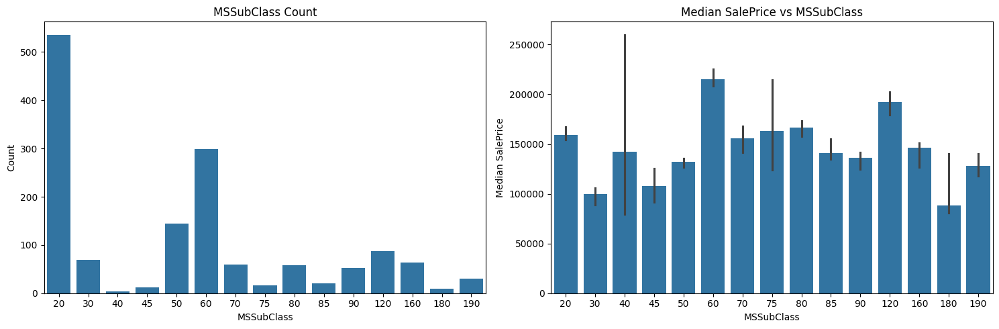

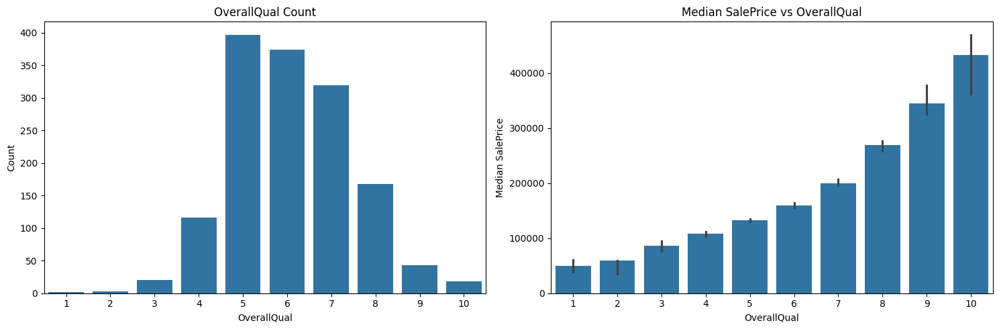

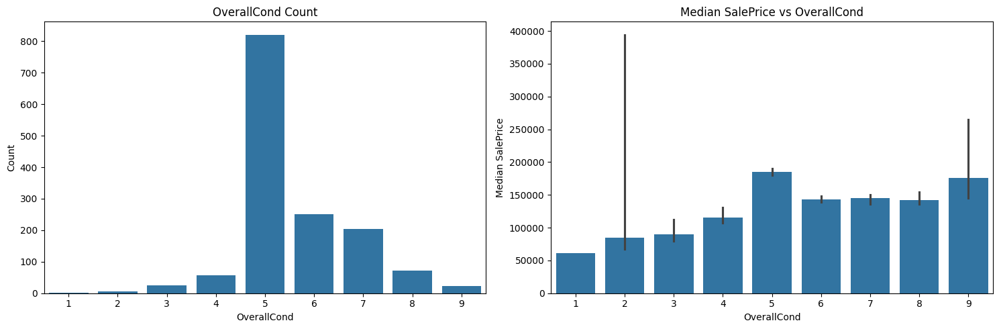

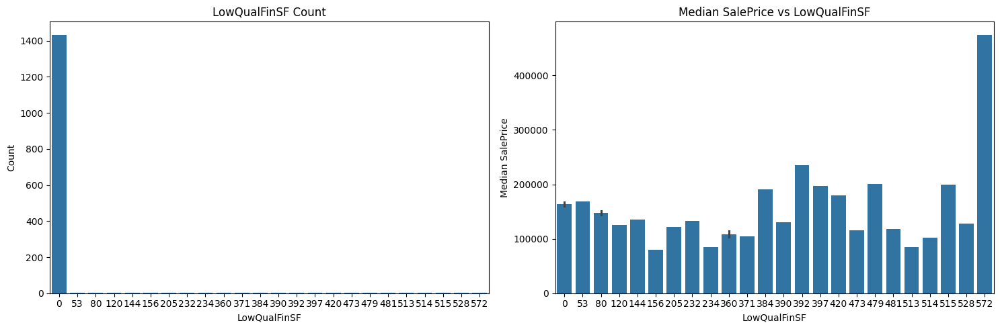

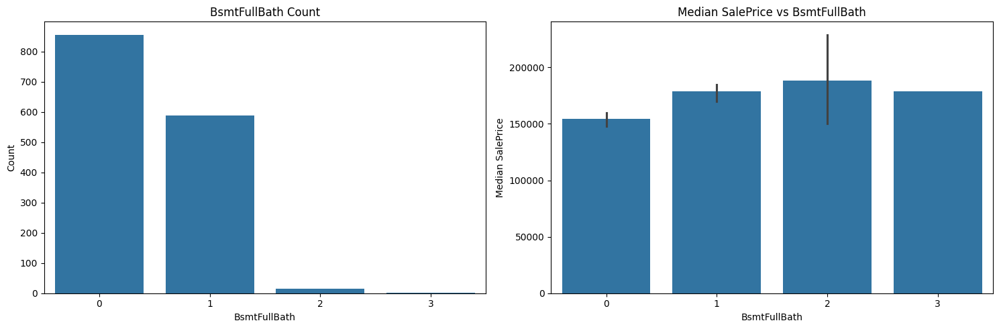

...

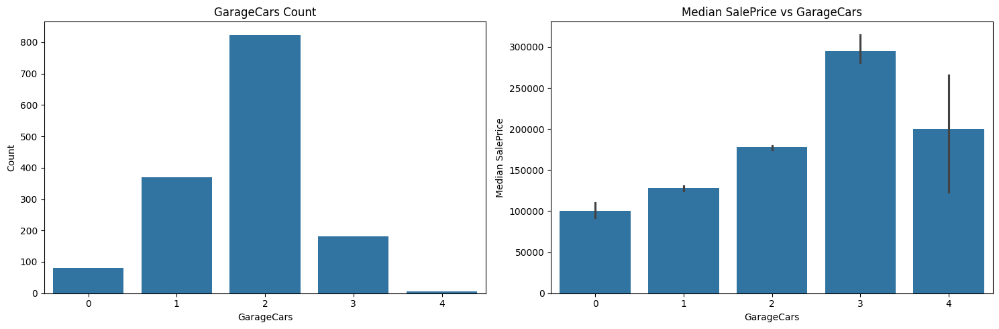

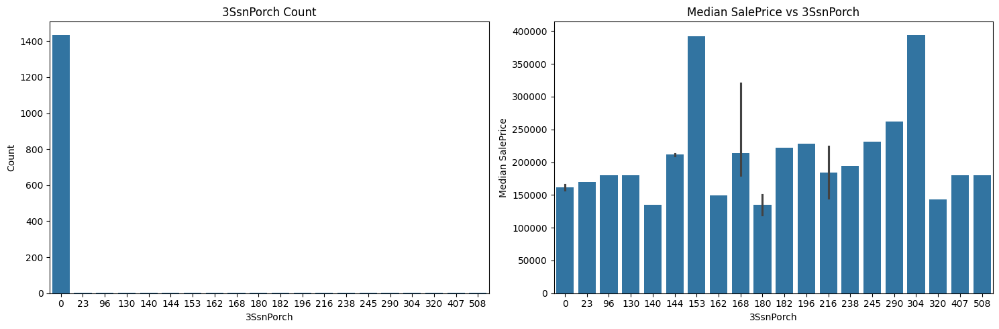

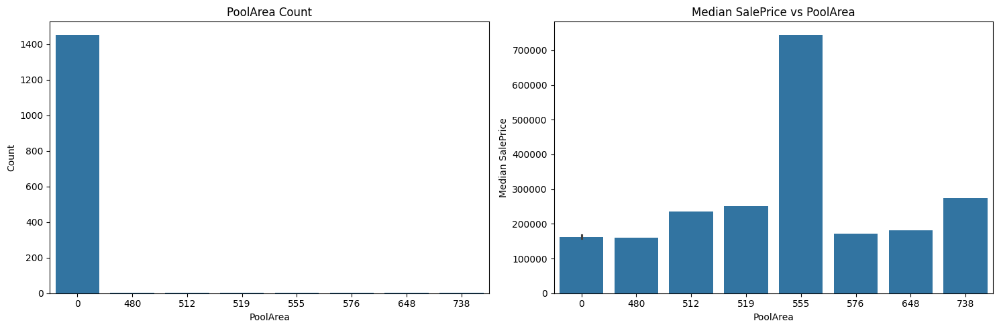

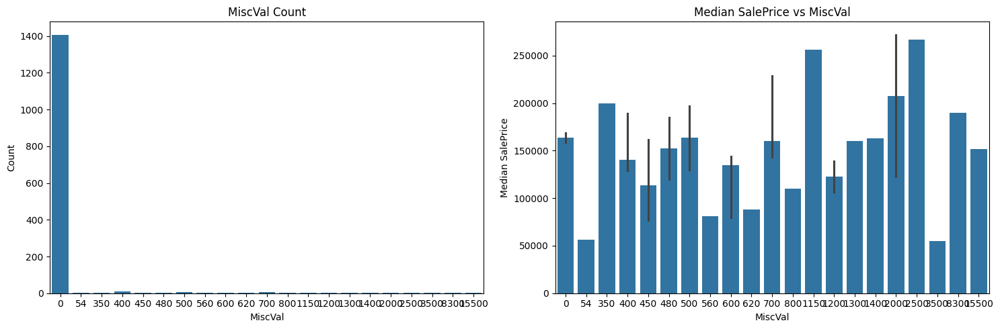

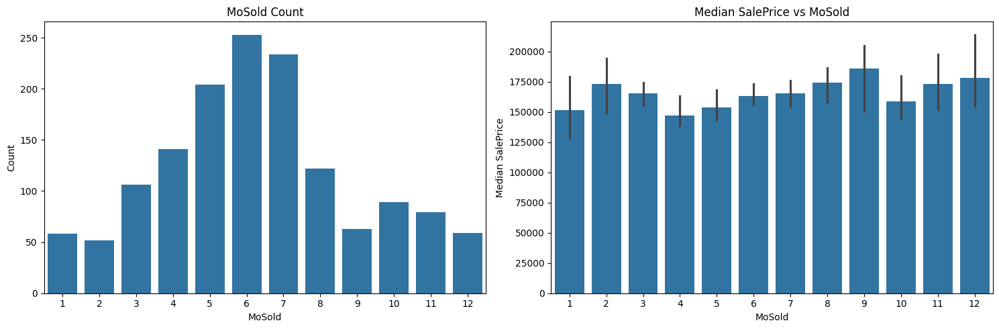

In [138]:
for feature in descrete_feature:
    plt.figure(figsize = (15,5))

    # Plot the count of occurrences
    plt.subplot(1, 2, 1)
    sns.countplot(x=feature, data=df)
    plt.title(f"{feature} Count")
    plt.xlabel(feature)
    plt.ylabel('Count')

    # Plot the median SalePrice
    plt.subplot(1, 2, 2)
    sns.barplot(x=feature, y='SalePrice', data=df, estimator=np.median)
    plt.title(f"Median SalePrice vs {feature}")
    plt.xlabel(feature)
    plt.ylabel('Median SalePrice')

    plt.tight_layout()
    plt.show()

In [139]:
continuous_feature = []
for feature in numerical_features:
    if feature not in descrete_feature + year + ['Id']:
        continuous_feature.append(feature)

print("continuous variables count: ", len(continuous_feature))
print("continuous features are: ")
for feature in continuous_feature:
    print(feature)

continuous variables count:  16
continuous features are: 
LotFrontage
LotArea
MasVnrArea
BsmtFinSF1
BsmtFinSF2
BsmtUnfSF
TotalBsmtSF
1stFlrSF
2ndFlrSF
GrLivArea
GarageArea
WoodDeckSF
OpenPorchSF
EnclosedPorch
ScreenPorch
SalePrice


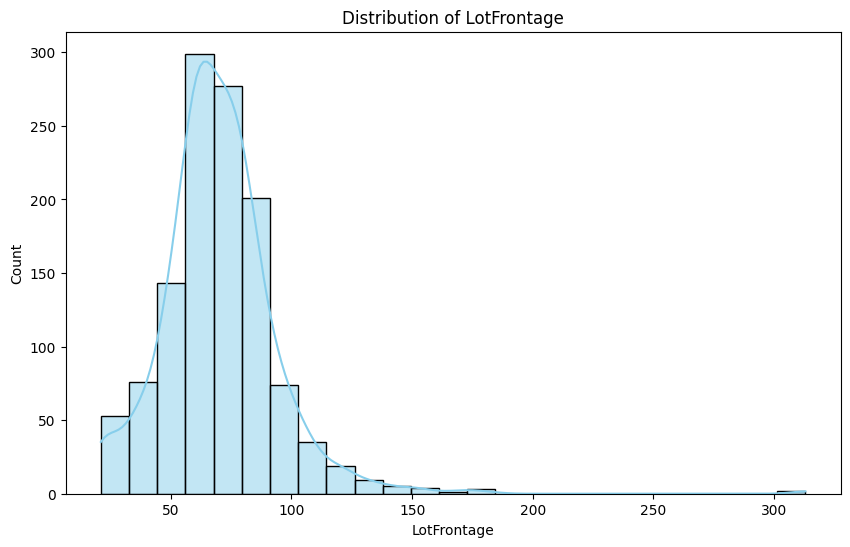

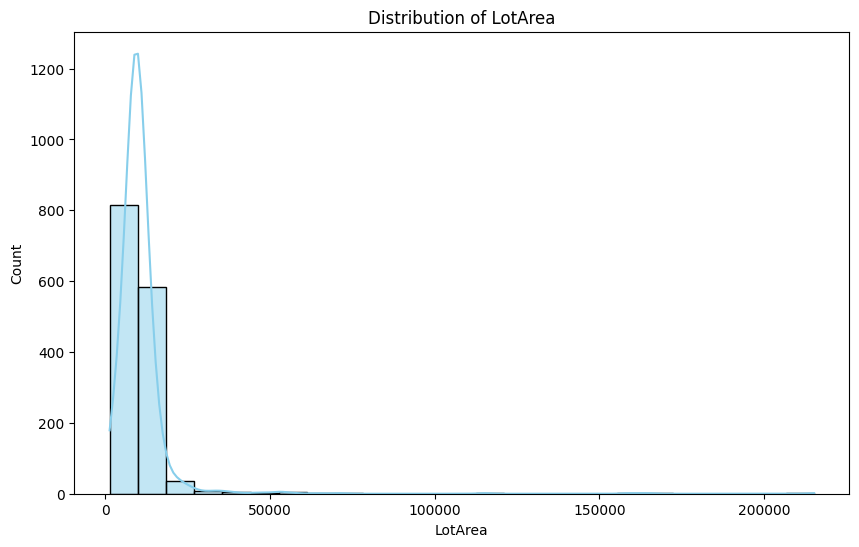

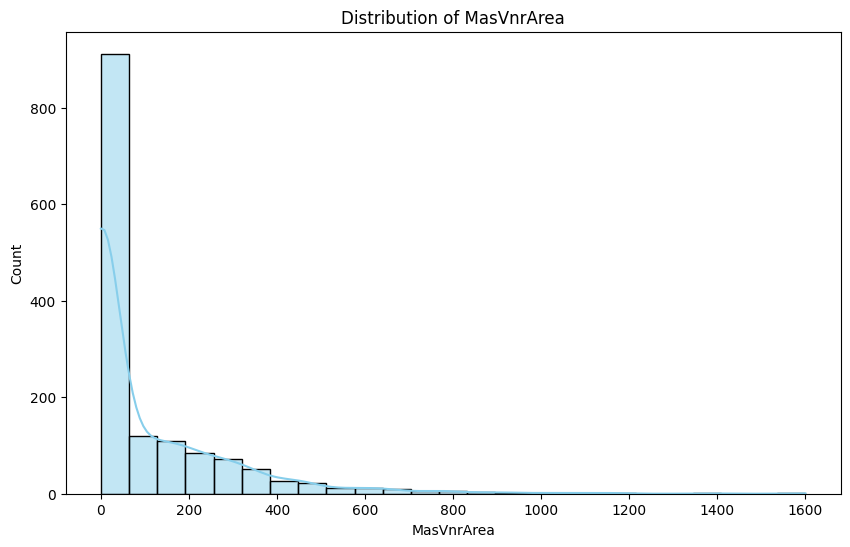

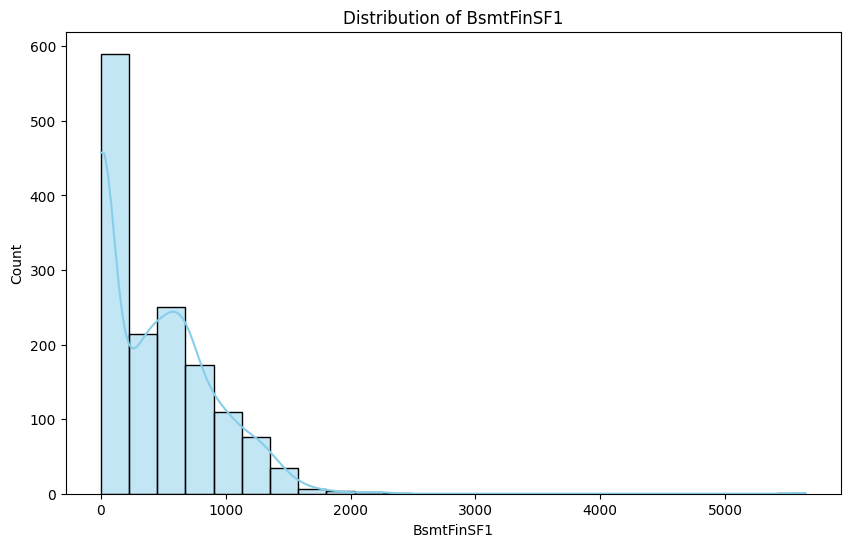

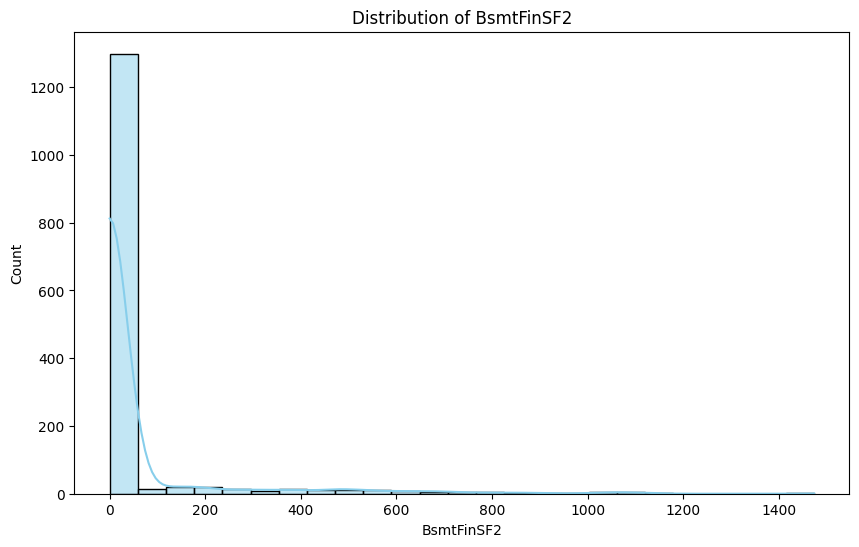

...

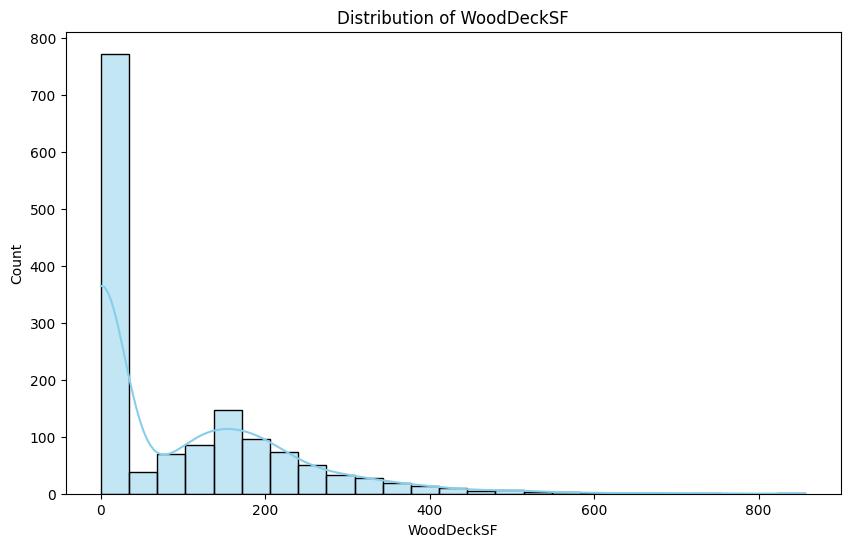

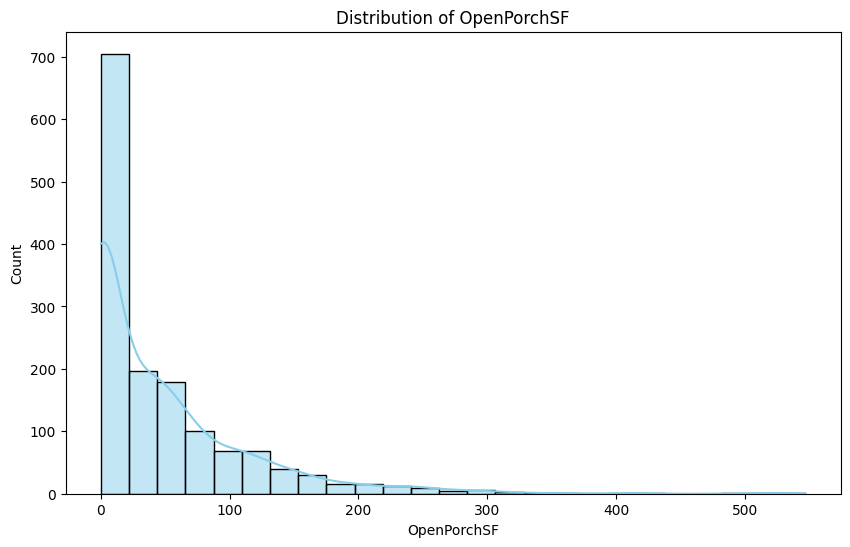

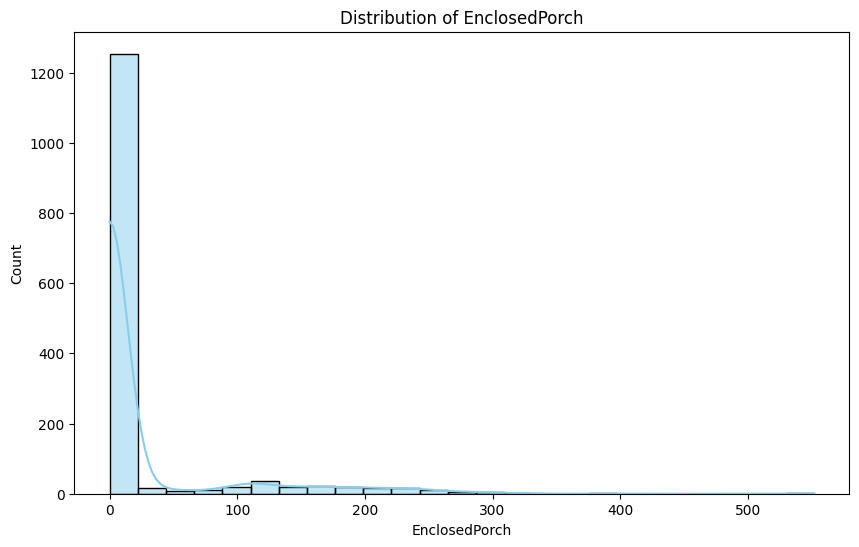

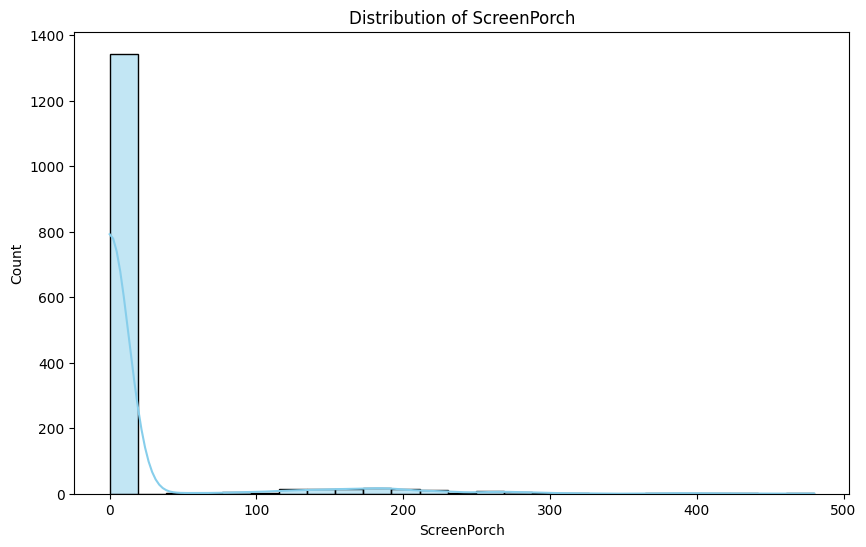

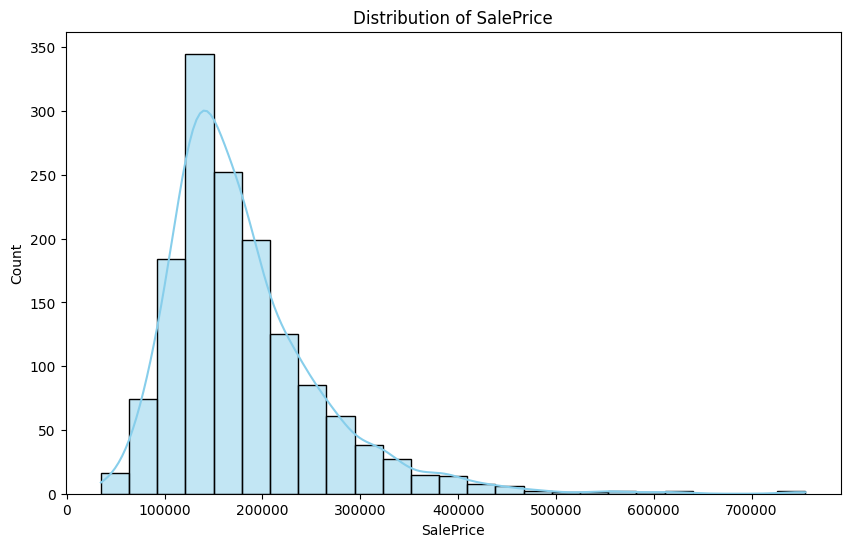

In [140]:
for feature in continuous_feature:
    plt.figure(figsize=(10, 6))
    
    # Plot histogram with KDE using seaborn
    sns.histplot(df[feature], bins=25, kde=True, color='skyblue')

    # Add labels and title
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(f"Distribution of {feature}")

    # Show the plot
    plt.show()

In [141]:
df[continuous_feature].describe()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,SalePrice
count,1201.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,70.049958,10516.828082,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,1515.463699,472.980137,94.244521,46.660274,21.954110,15.060959,180921.195890
std,24.284752,9981.264932,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,525.480383,213.804841,125.338794,66.256028,61.119149,55.757415,79442.502883
min,21.000000,1300.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34900.000000
25%,59.000000,7553.500000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,1129.500000,334.500000,0.000000,0.000000,0.000000,0.000000,129975.000000
50%,69.000000,9478.500000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,1464.000000,480.000000,0.000000,25.000000,0.000000,0.000000,163000.000000
75%,80.000000,11601.500000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,1776.750000,576.000000,168.000000,68.000000,0.000000,0.000000,214000.000000
max,313.000000,215245.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,1418.000000,857.000000,547.000000,552.000000,480.000000,755000.000000


In [142]:
correlation_matrix = df[continuous_feature + ['SalePrice']].corr()
correlation_matrix

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,SalePrice,SalePrice
LotFrontage,1.000000,0.426095,0.193458,0.233633,0.049900,0.132644,0.392075,0.457181,0.080177,0.402797,0.344997,0.088521,0.151972,0.010700,0.041383,0.351799,0.351799
LotArea,0.426095,1.000000,0.104160,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.263116,0.180403,0.171698,0.084774,-0.018340,0.043160,0.263843,0.263843
MasVnrArea,0.193458,0.104160,1.000000,0.264736,-0.072319,0.114442,0.363936,0.344501,0.174561,0.390857,0.373066,0.159718,0.125703,-0.110204,0.061466,0.477493,0.477493
BsmtFinSF1,0.233633,0.214103,0.264736,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,0.208171,0.296970,0.204306,0.111761,-0.102303,0.062021,0.386420,0.386420
BsmtFinSF2,0.049900,0.111170,-0.072319,-0.050117,1.000000,-0.209294,0.104810,0.097117,-0.099260,-0.009640,-0.018227,0.067898,0.003093,0.036543,0.088871,-0.011378,-0.011378
BsmtUnfSF,0.132644,-0.002618,0.114442,-0.495251,-0.209294,1.000000,0.415360,0.317987,0.004469,0.240257,0.183303,-0.005316,0.129005,-0.002538,-0.012579,0.214479,0.214479
TotalBsmtSF,0.392075,0.260833,0.363936,0.522396,0.104810,0.415360,1.000000,0.819530,-0.174512,0.454868,0.486665,0.232019,0.247264,-0.095478,0.084489,0.613581,0.613581
1stFlrSF,0.457181,0.299475,0.344501,0.445863,0.097117,0.317987,0.819530,1.000000,-0.202646,0.566024,0.489782,0.235459,0.211671,-0.065292,0.088758,0.605852,0.605852
2ndFlrSF,0.080177,0.050986,0.174561,-0.137079,-0.099260,0.004469,-0.174512,-0.202646,1.000000,0.687501,0.138347,0.092165,0.208026,0.061989,0.040606,0.319334,0.319334
GrLivArea,0.402797,0.263116,0.390857,0.208171,-0.009640,0.240257,0.454868,0.566024,0.687501,1.000000,0.468997,0.247433,0.330224,0.009113,0.101510,0.708624,0.708624


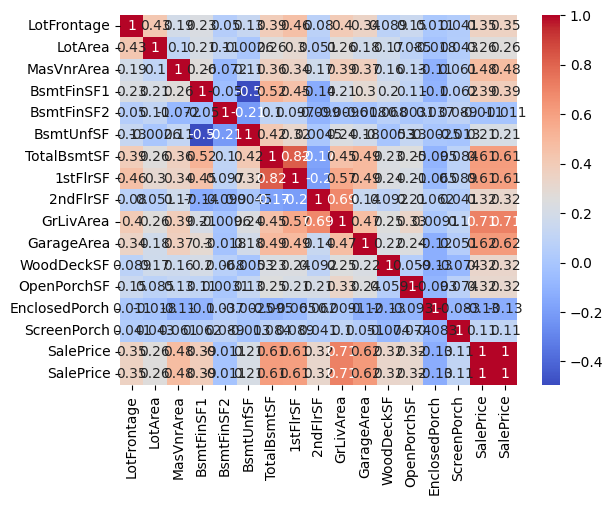

In [143]:
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()

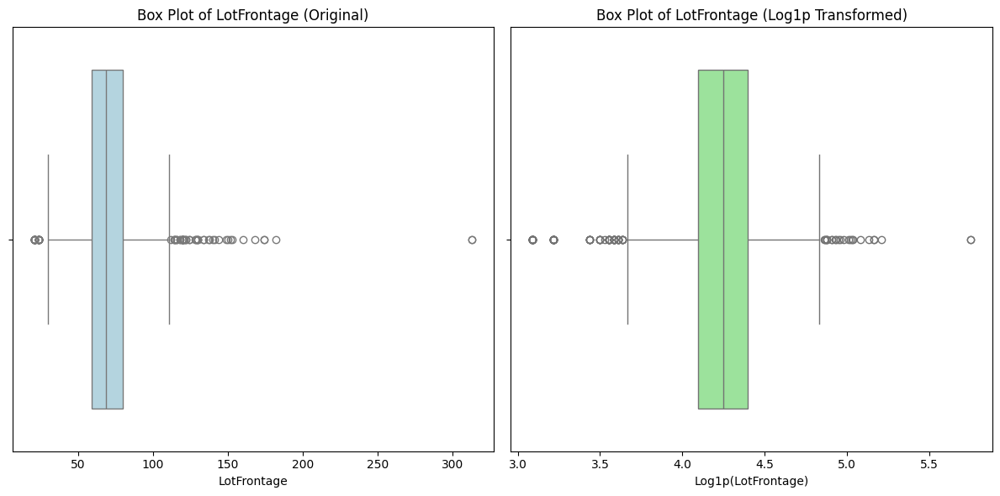

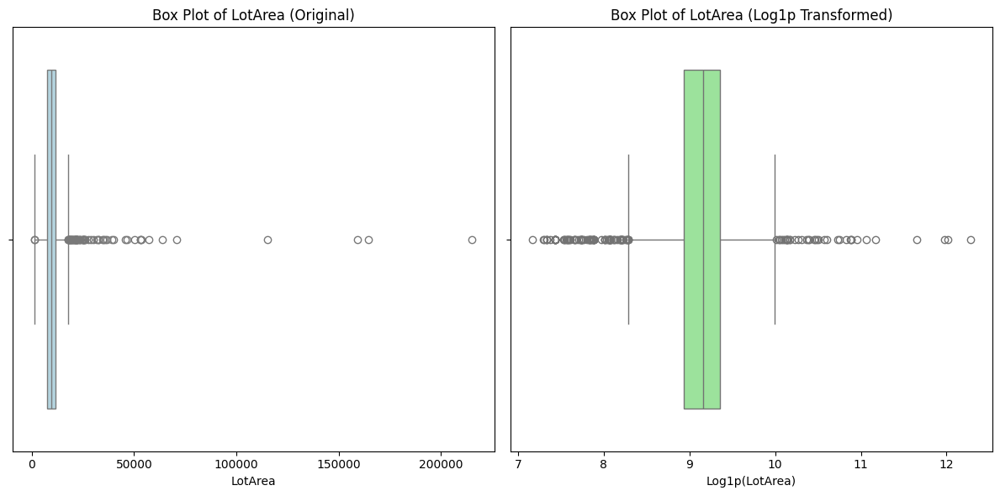

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

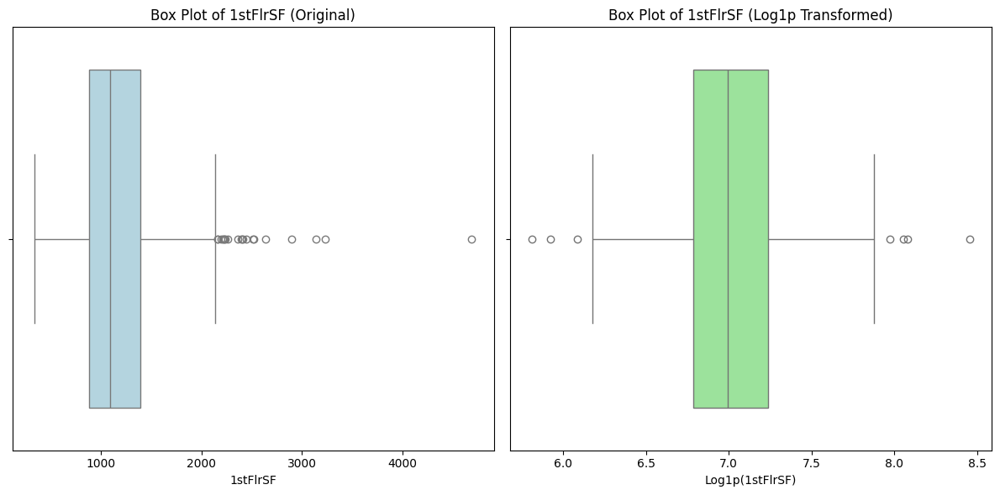

<Figure size 1200x600 with 0 Axes>

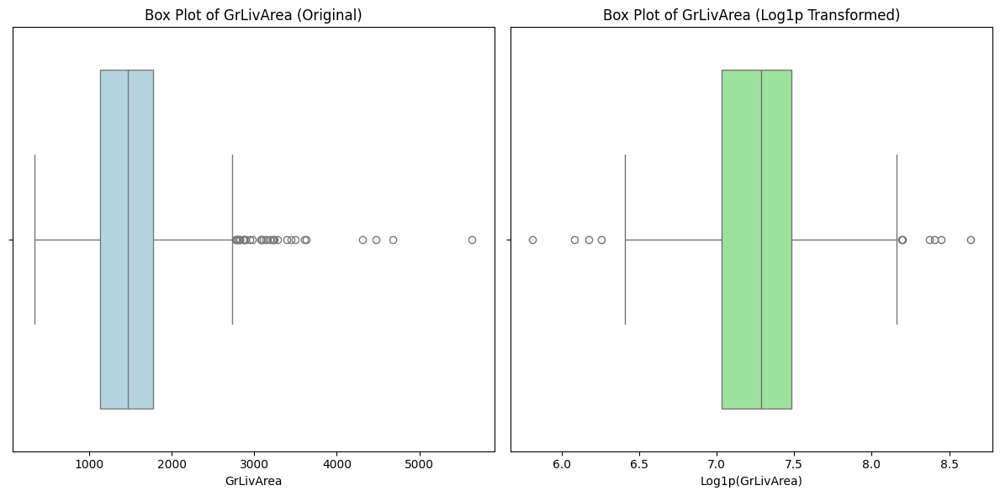

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

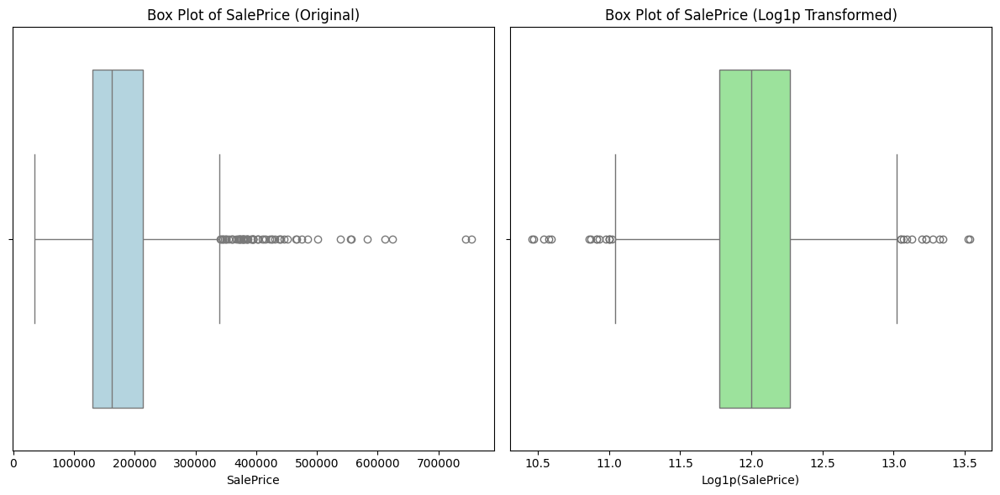

In [144]:
for feature in continuous_feature:
    plt.figure(figsize=(12, 6))
    #if feature contains 0 value then remove it
    if 0 in df[feature].unique():
        continue

    # no transformation applied
    plt.subplot(1, 2, 1)
    sns.boxplot(x=df[feature], color='lightblue')
    plt.title(f'Box Plot of {feature} (Original)')
    plt.xlabel(feature)

    # use log1p transformation
    df[feature] = np.log1p(df[feature])

    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[feature], color='lightgreen')
    plt.title(f'Box Plot of {feature} (Log1p Transformed)')
    plt.xlabel(f'Log1p({feature})')

    plt.tight_layout()
    plt.show()

In [145]:
categorical_feature = df.select_dtypes(include = 'object').columns

for feature in categorical_feature:
    print(f"{feature}: {df[feature].nunique()} unique values")
    print(df[feature].unique())
    print('.' * 100)

MSZoning: 5 unique values
['RL' 'RM' 'C (all)' 'FV' 'RH']
....................................................................................................
Street: 2 unique values
['Pave' 'Grvl']
....................................................................................................
Alley: 2 unique values
[nan 'Grvl' 'Pave']
....................................................................................................
LotShape: 4 unique values
['Reg' 'IR1' 'IR2' 'IR3']
....................................................................................................
LandContour: 4 unique values
['Lvl' 'Bnk' 'Low' 'HLS']
....................................................................................................
Utilities: 2 unique values
['AllPub' 'NoSeWa']
....................................................................................................
LotConfig: 5 unique values
['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
..............................

In [146]:
df[categorical_feature].head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


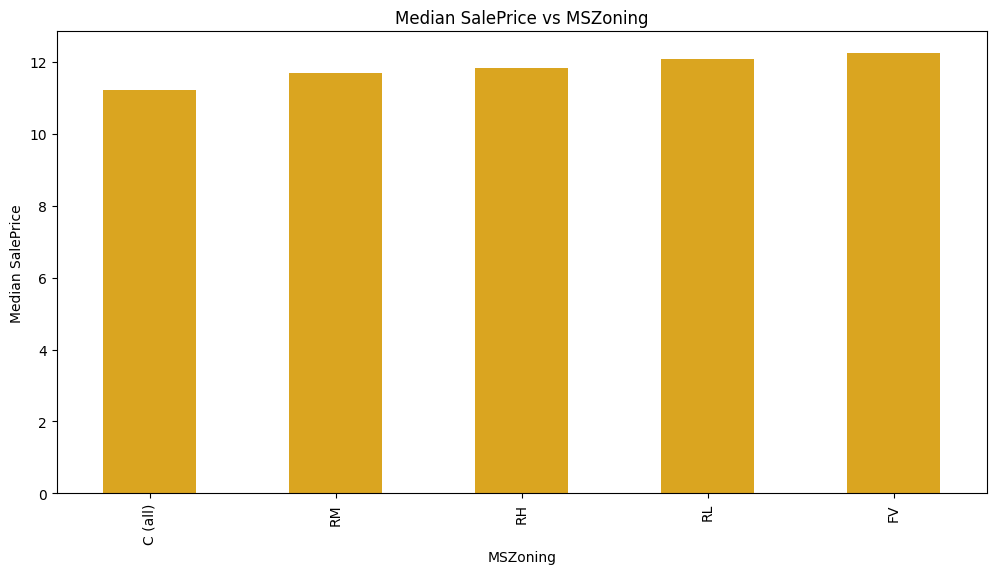

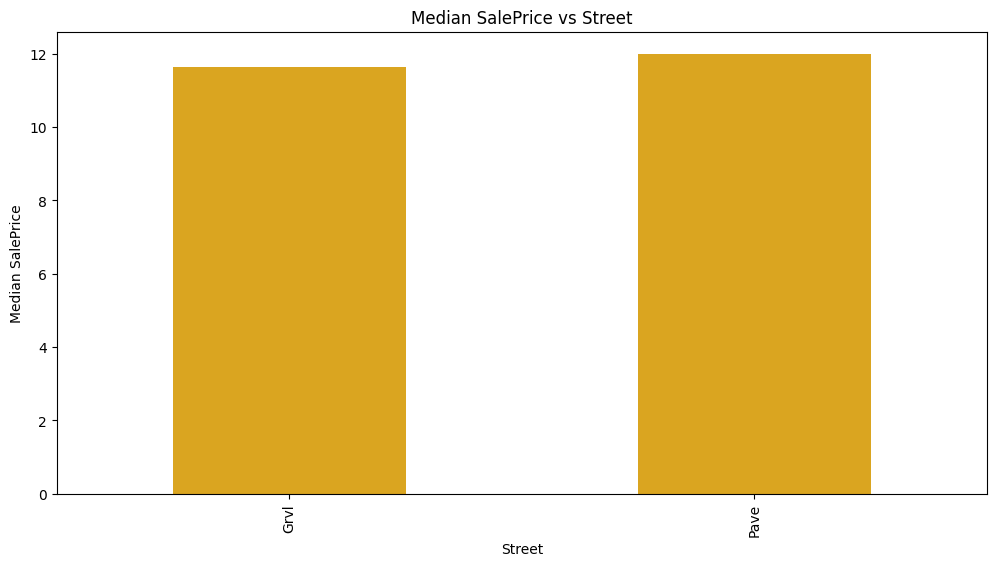

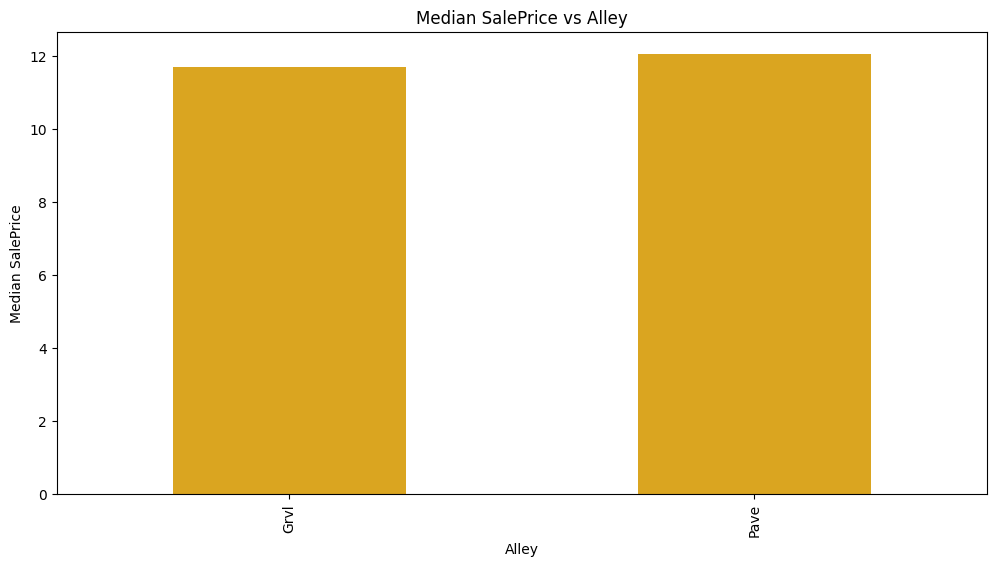

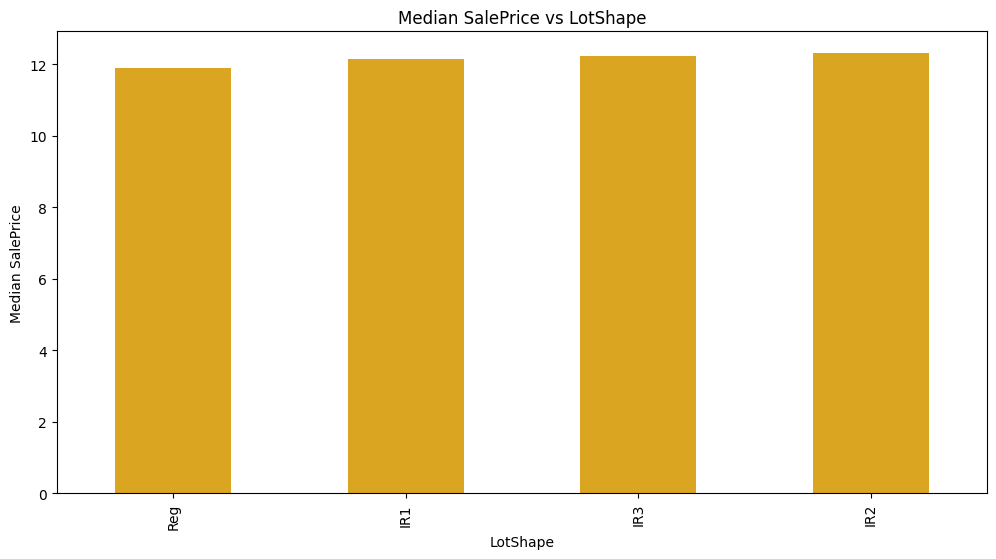

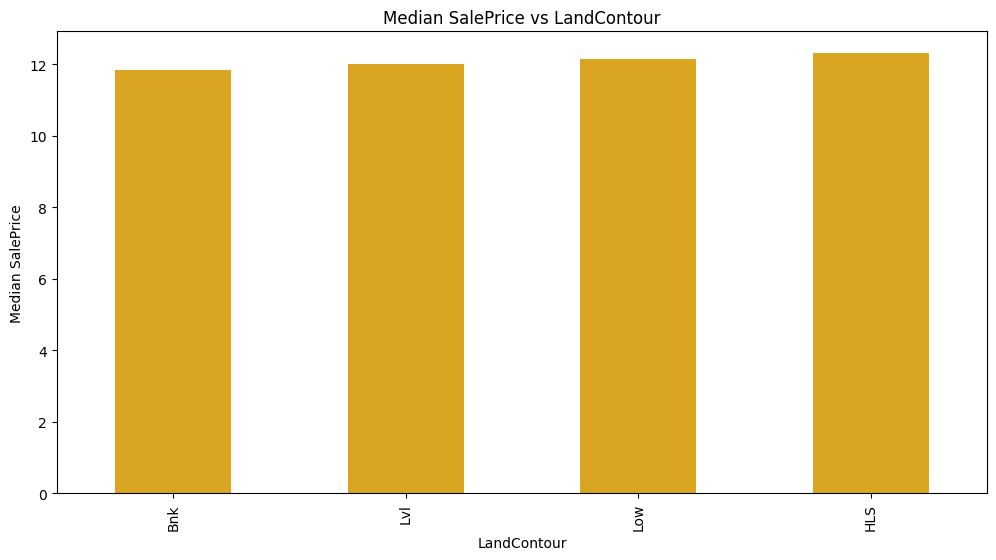

...

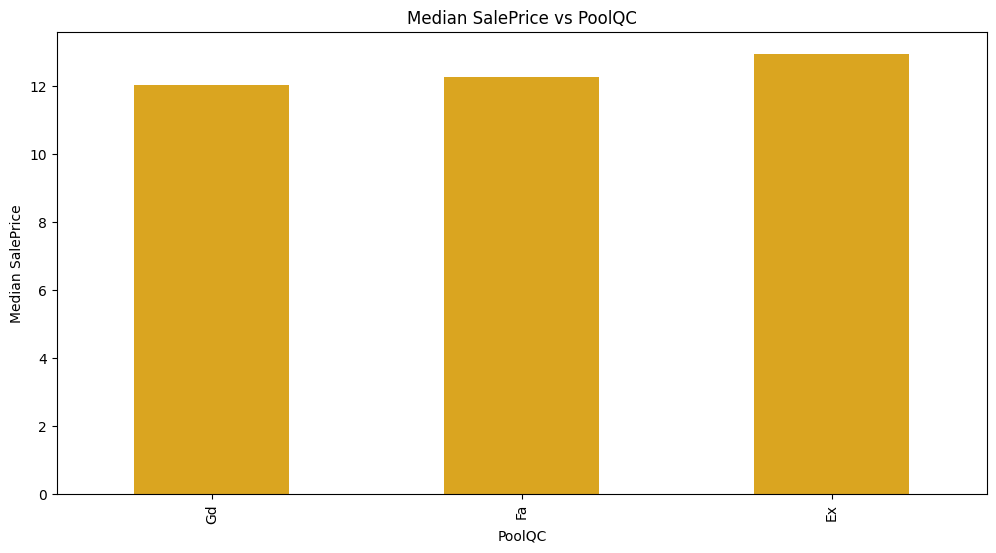

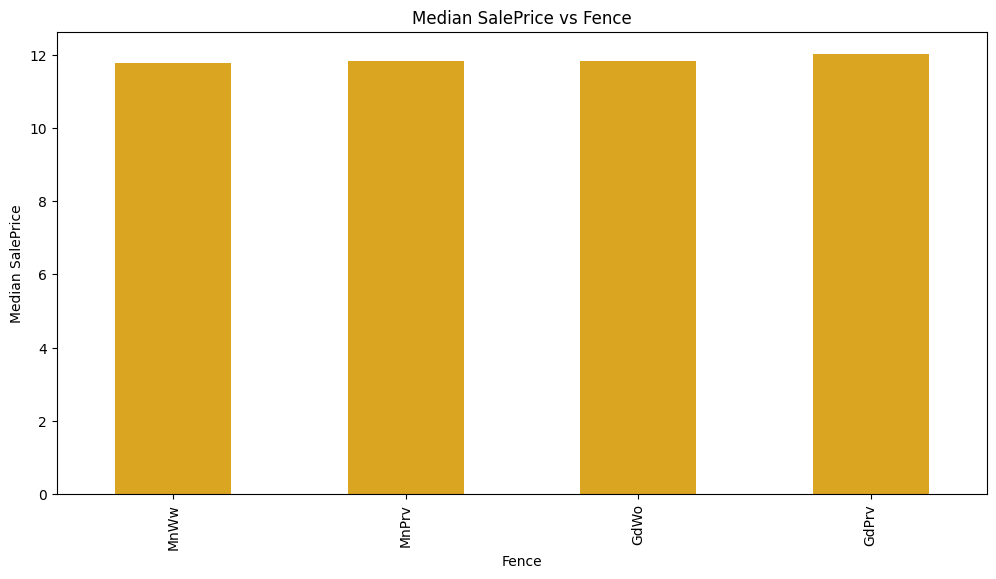

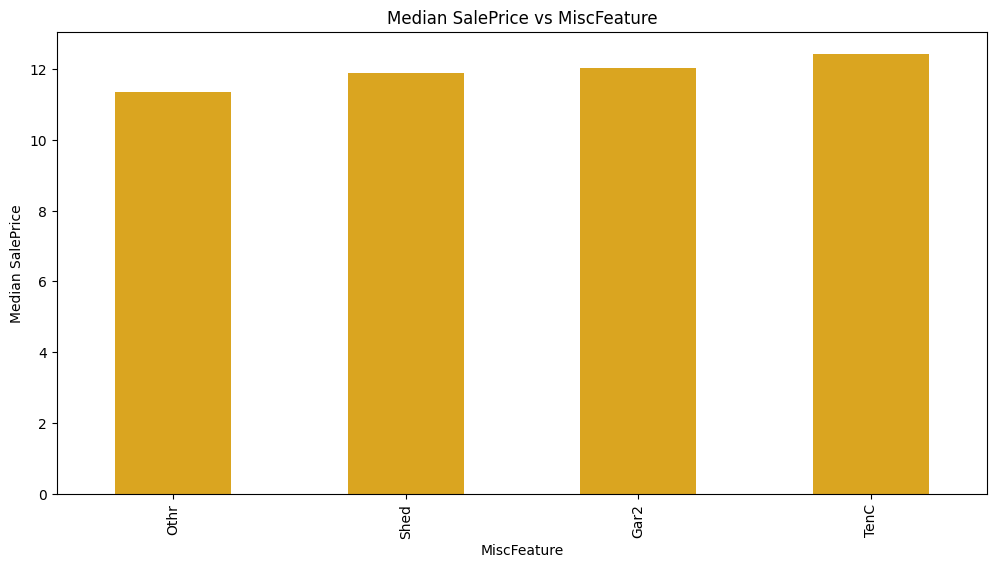

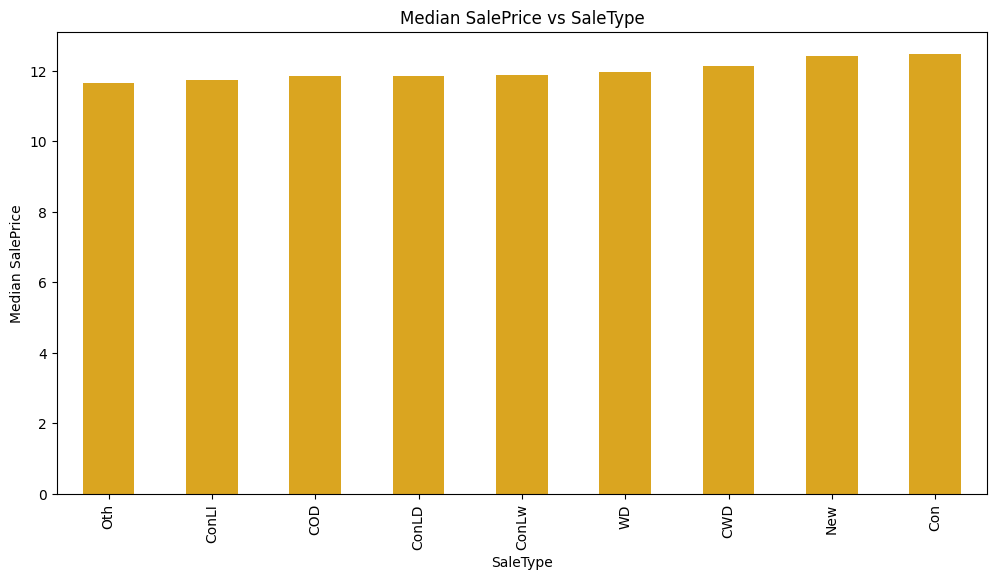

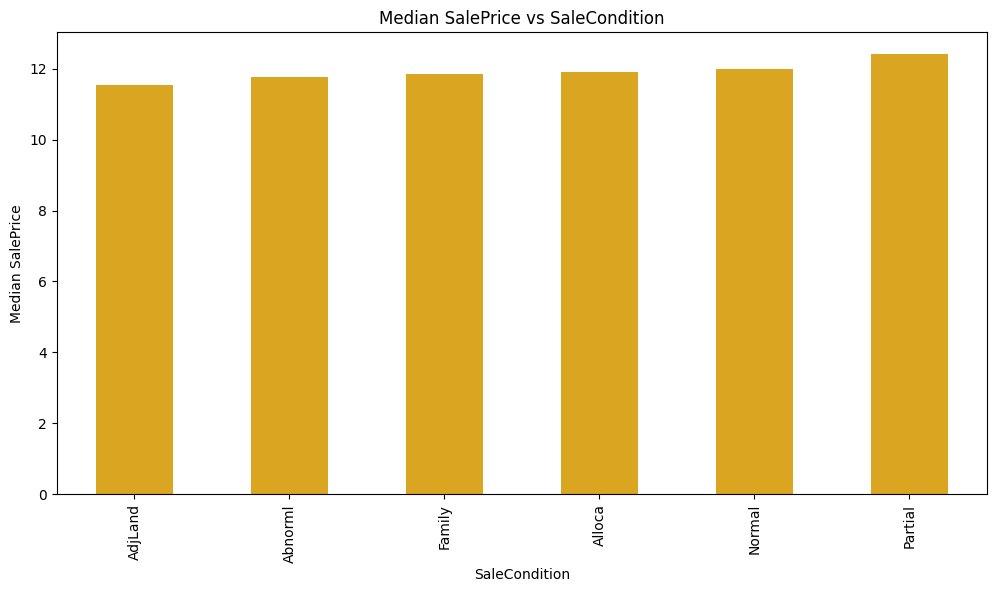

In [147]:
for feature in categorical_feature:
    plt.figure(figsize=(12, 6))

    median = df.groupby(feature)['SalePrice'].median().sort_values()

    median.plot(kind = 'bar', color = 'goldenrod')

    plt.xlabel(feature)
    plt.ylabel('Median SalePrice')
    plt.title(f'Median SalePrice vs {feature}')

    plt.show()

# Correlation analysis

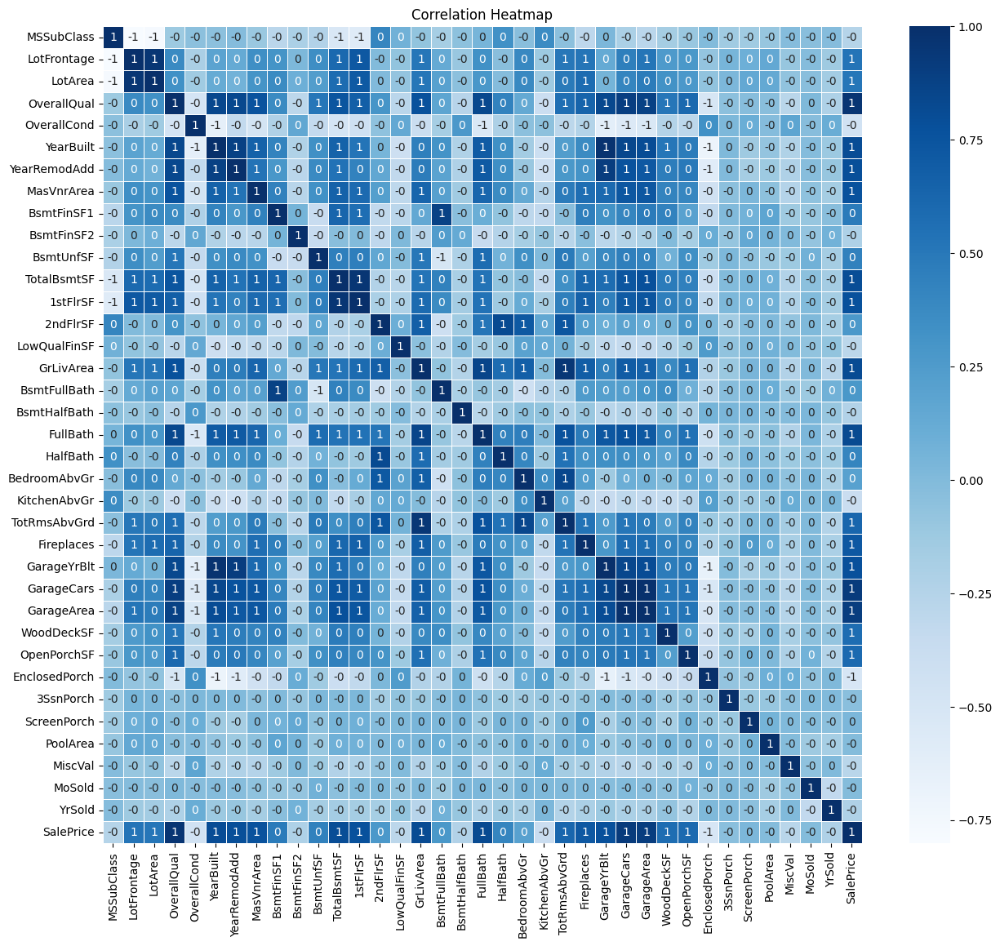

In [148]:
def correlation_analysis(data, heatmap = True):
    numerical_data = data.select_dtypes(include = ['number'])

    corr_matrix = numerical_data.corr()

    if heatmap:
        plt.figure(figsize=(15, 13))
        sns.heatmap(corr_matrix, annot=True, cmap='Blues', fmt="0.0f", linewidths=0.5)
        plt.title('Correlation Heatmap')
        plt.show()

    return corr_matrix


corr = df.drop(columns='Id').corr(numeric_only=True)

correl = correlation_analysis(corr) # this makes sure that only heatmap is returned otherwise whole value be there as well

In [149]:
correlation=corr["SalePrice"].apply(abs).sort_values(ascending=False).reset_index()
print(correlation.shape)
correlation

(37, 2)


,index,SalePrice
0,SalePrice,1.000000
1,OverallQual,0.817185
2,GrLivArea,0.730254
3,GarageCars,0.680625
4,GarageArea,0.650888
5,TotalBsmtSF,0.612134
6,1stFlrSF,0.608955
7,FullBath,0.594771
8,YearBuilt,0.586570
9,YearRemodAdd,0.565608


In [150]:
df = df.drop(columns=missing_data[missing_data['Total'] > 81].index)
df = df.dropna(subset=['Electrical'])# drop rows where electrical has missing values

print(f"Shape of dataframe: {df.shape}")# Display the shape of the DataFrame after removal

max_missing = df.isnull().sum().max()# Check for any remaining missing values
print(f"Maximum missing values in any column: {max_missing}")


Shape of dataframe: (1459, 74)
Maximum missing values in any column: 81


In [151]:
# Print the shape of the DataFrame before removing columns with weak correlation
print(f"Shape before removing weakly correlated columns: {df.shape}")

# Identify columns with weak correlation (from the 22nd onward)
columnsr = correlation.iloc[21:, 0]

# Drop columns with weak correlation
df = df.drop(columns=columnsr)

# Print the shape of the DataFrame after the removal
print(f"Shape after removing weakly correlated columns: {df.shape}")


Shape before removing weakly correlated columns: (1459, 74)
Shape after removing weakly correlated columns: (1459, 58)


In [152]:
name_of_coll = df.drop(columns="Id").select_dtypes(include=['number']).columns
for col in name_of_coll:
    nan_indices = df[col].isnull()  # Find the indices of NaN
    random_samples = df[col].dropna().sample(n=nan_indices.sum(), replace=True)  # Sample of the column without NaN
    df.loc[nan_indices, col] = random_samples.values

In [153]:
col_has_numbers = df.drop(columns="Id").select_dtypes(include=['number'])
col_has_numbers.isnull().sum().sort_values(ascending=False)


LotArea         0
OverallQual     0
OpenPorchSF     0
WoodDeckSF      0
GarageArea      0
GarageCars      0
GarageYrBlt     0
Fireplaces      0
TotRmsAbvGrd    0
HalfBath        0
FullBath        0
GrLivArea       0
2ndFlrSF        0
1stFlrSF        0
TotalBsmtSF     0
BsmtFinSF1      0
MasVnrArea      0
YearRemodAdd    0
YearBuilt       0
SalePrice       0
dtype: int64

In [154]:

categorical_columns = df.drop(columns = 'Id').select_dtypes(include = ['object']).columns
for col in categorical_columns:
    mode_value = df[col].mode()[0]
    df[col] = df[col].fillna(mode_value) 
missing_values =  df[categorical_columns].isnull().sum().sort_values(ascending=False)

missing_values

MSZoning         0
BsmtQual         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
SaleType         0
BsmtCond         0
Foundation       0
Street           0
ExterCond        0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
ExterQual        0
SaleCondition    0
dtype: int64

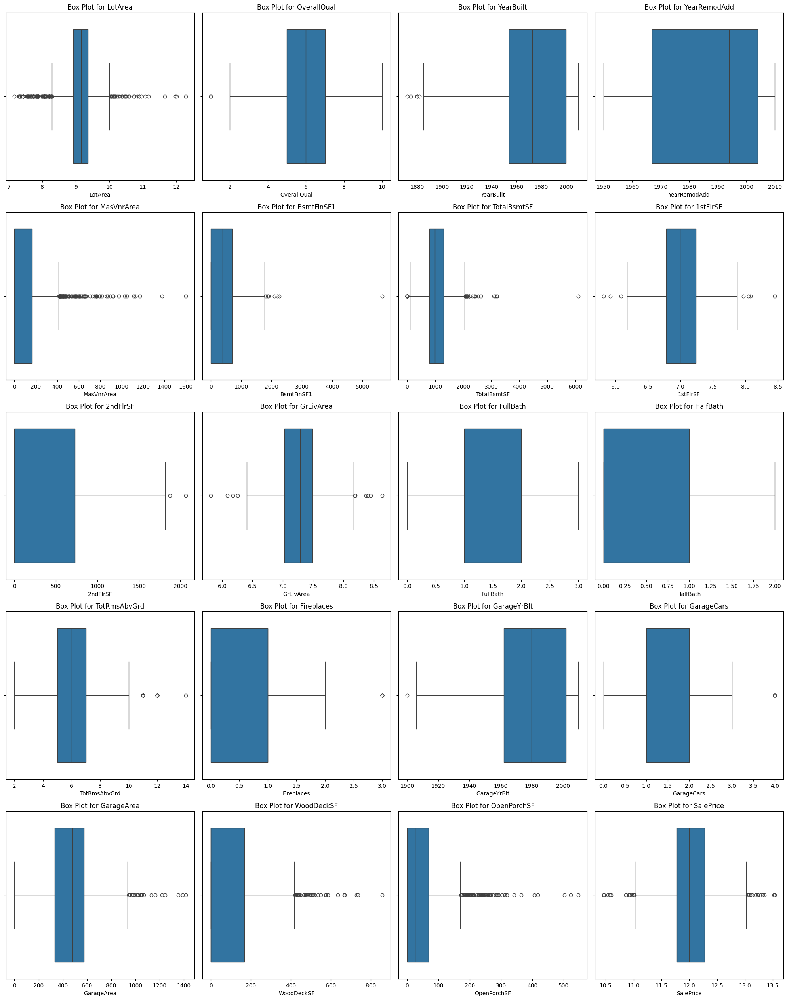

In [179]:
# Outliers , Lets Display BoxPlot for each columns
df_num2 = df.select_dtypes(include = 'number').drop(columns = 'Id')

fig, axes = plt.subplots(nrows = 8, ncols = 4, figsize = (20, 40))
axes = axes.flatten()
for i, col in enumerate(df_num2.columns):
    sns.boxplot(x = df_num2[col], ax = axes[i])
    axes[i].set_title(f'Box Plot for {col}')

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()
    
    

# Feature Encoding

In [193]:
df_obj

Index(['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional',
       'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive',
       'SaleType', 'SaleCondition'],
      dtype='object')

In [199]:
textcol = df.select_dtypes(include = 'object').columns
textcol = pd.DataFrame(textcol, columns = ['text col'])
print(f"number of text columns: {textcol.shape[0]}")
textcol.head()


number of text columns: 37


,text col
0,MSZoning
1,Street
2,LotShape
3,LandContour
4,Utilities


In [208]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
for col in textcol.values.flatten():
    df[col] = encoder.fit_transform(df[col])

In [209]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1459 entries, 0 to 1459
Data columns (total 58 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSZoning       1459 non-null   int64  
 2   LotArea        1459 non-null   float64
 3   Street         1459 non-null   int64  
 4   LotShape       1459 non-null   int64  
 5   LandContour    1459 non-null   int64  
 6   Utilities      1459 non-null   int64  
 7   LotConfig      1459 non-null   int64  
 8   LandSlope      1459 non-null   int64  
 9   Neighborhood   1459 non-null   int64  
 10  Condition1     1459 non-null   int64  
 11  Condition2     1459 non-null   int64  
 12  BldgType       1459 non-null   int64  
 13  HouseStyle     1459 non-null   int64  
 14  OverallQual    1459 non-null   int64  
 15  YearBuilt      1459 non-null   int64  
 16  YearRemodAdd   1459 non-null   int64  
 17  RoofStyle      1459 non-null   int64  
 18  RoofMatl     

# Model Creation

In [210]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score


In [237]:

x = df.drop(columns = ['SalePrice'])
y = df['SalePrice']


In [238]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [239]:
scaler = StandardScaler(copy = True, with_std = True)
X_train = scaler.fit_transform(X_train)
X_test = scaler.fit_transform(X_test)
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [240]:
print(f"Train score: {model.score(X_train, y_train)}")
print(f"Test score: {model.score(X_test, y_test)}")

Train score: 0.8832512762338088
Test score: 0.8945190904390763


In [241]:
y_pred = model.predict(X_test)

In [242]:
# Evaluation Metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"coefficient of determination: {r2}")

Mean Squared Error: 0.01816852607738933
coefficient of determination: 0.8945190904390763


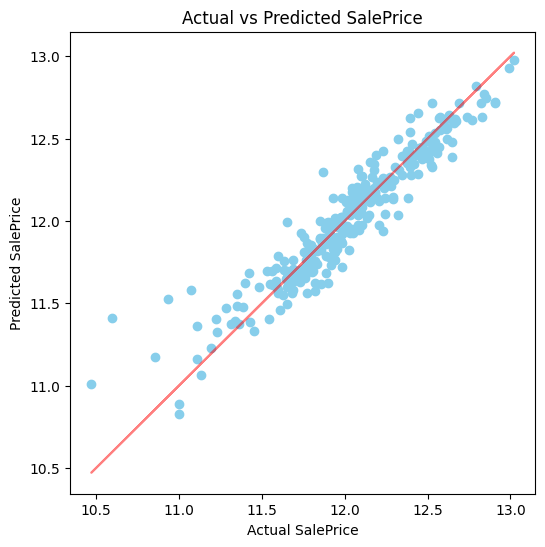

In [244]:
plt.figure(figsize = (6, 6))
plt.plot(y_test, y_test, color='red', alpha = 0.5)
plt.scatter(y_test, y_pred, color = 'skyblue')
plt.xlabel('Actual SalePrice')
plt.ylabel('Predicted SalePrice')
plt.title('Actual vs Predicted SalePrice')
plt.show()